A notebook for guiding image capture and reflectance and stereo calibration with the OROCHI laboratory simulator.

Experiments performed on 28/04/2023

- Reflectance Calibration
- Geometric Calibration
- Dark Calibration Target
- Sample 1
- Sample 2
- Sample 3
- Sample 4
- Sample 5

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Overview

The steps are as follows. Note that dark image capture is reserved for the end, to minimise physical interactions with the cameras.

1. Reflectace Calibration Target Imaging
    - Prompt: Lens Cap removal, put calibration target in place
    - Cycle over cameras. For each camera:
        - Test the connection
        - load/configure the camera
        - get optimal exposure and check ROI
        - capture repeat images of the calibration target
        - save the images
        - save the exposures used
2. Geometric Calibration Target Imaging
    - Prompt: Lens Cap removal, put geometric calibration target in place
    - Cycle over cameras. For each camera:
        - Test the connection
        - load/configure the camera
        - get optimal exposure and check ROI
        - capture repeat images of the geometric calibration target
        - save the images
        - save the exposures used
3. Sample Imaging
    - as above, but with the sample replacing the calibration target
    - repeat for each of 4 different samples
4. Dark Imaging
    - Prompt: Lens cap on / lights out
    - Cycle over cameras. For each camera:
        - check connection
            - Calibration darks:
                - load calibration exposure for given camera
                - set exposure
                - capture repeat frames
                - save frames
            - Sample darks:
                - as aove but load sample exposures instead
5. Processing to Reflectance

# Setup

Here we setup the IC object, load the camera configuration file, and connect to and initiate the OROCHI camera channels.

In [2]:
import orochi_sim_ctrl as osc

ic = osc.start_ic()
camera_config = osc.load_camera_config()
cameras = osc.connect_cameras(ic, camera_config)
osc.configure_cameras(cameras)

Device 0 (DMK 33GX249 10910288) succesfully connected.
Device 1 (DMK 33GX249 10910273) succesfully connected.
Device 3 (DMK 33GX249 10910294) succesfully connected.
Device 4 (DMK 33GX249 10910291) succesfully connected.
Device 5 (DMK 33GX249 10910295) succesfully connected.
Device 7 (DMK 33GX249 23120778) succesfully connected.
Device 6 (DMK 33GX249 10910265) succesfully connected.
-----------------------------------
Device 0 (DMK 33GX249 10910288)
-----------------------------------
Color Format set to : "Y800 (1920x1200)"
Frame Rate set to : 30.0 FPS
Brightness Value set to 416
Contrast Value set to 0
Sharpness Value set to 0
Gamma Value set to 100
Gain Value set to 0.0
Gain Auto set to 0
Exposure Value set to 0.009999999776482582
Exposure Auto set to 1
Exposure Auto Reference set to 80
Exposure Auto Max Value set to 10.0
Exposure Auto Max Auto set to 0
Trigger Enable set to 0
Denoise Value set to 0
Flip Horizontal Enable set to 0
Flip Vertical Enable set to 0
Highlight Reduction Ena

## Set ROIs

x: 545
y: 634


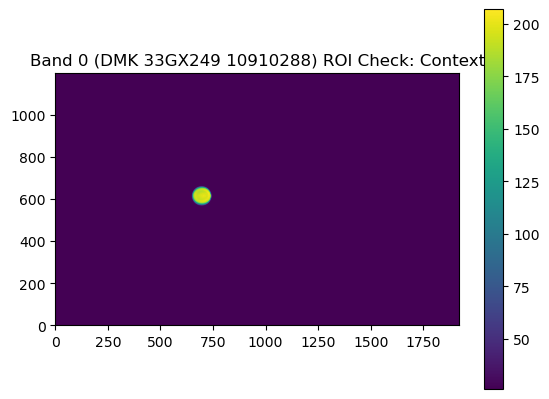

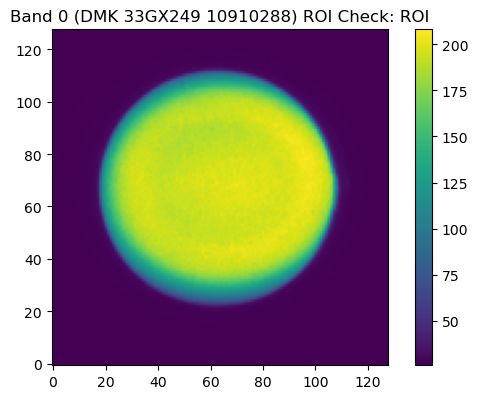

x: 238
y: 896


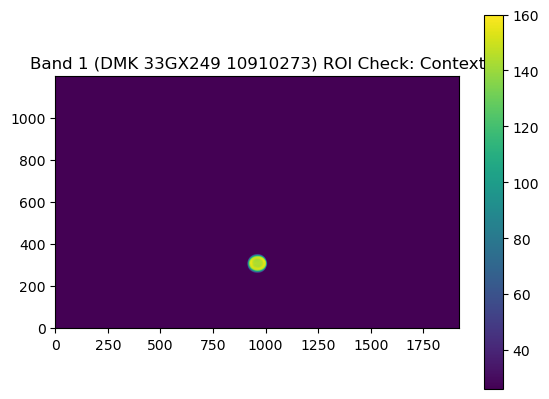

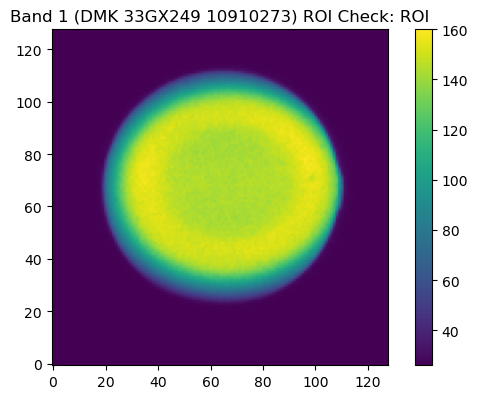

x: 227
y: 618


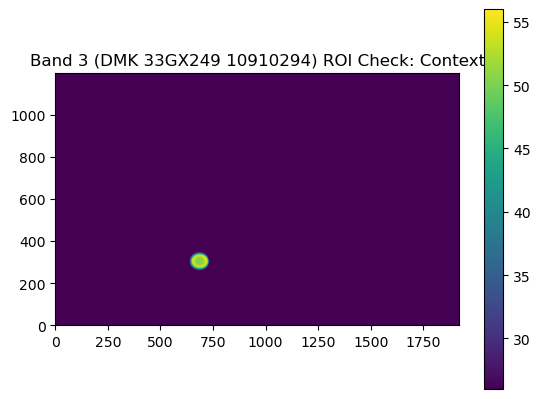

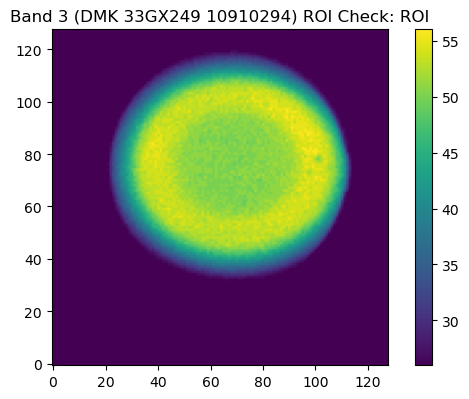

x: 531
y: 1185


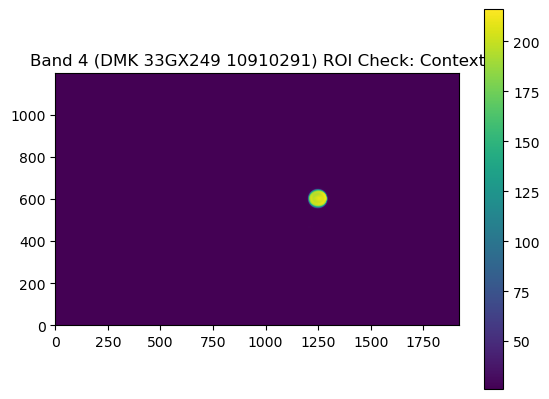

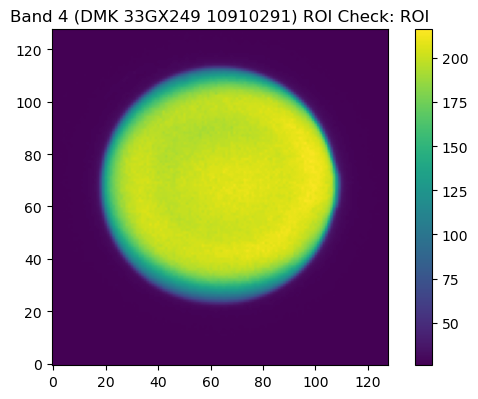

x: 868
y: 642


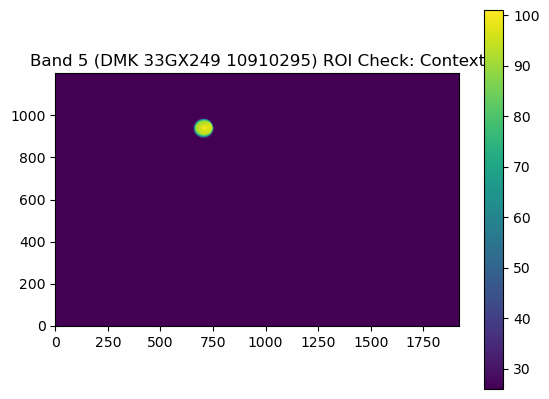

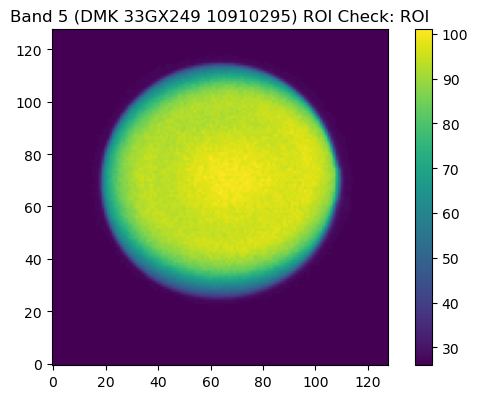

x: 867
y: 911


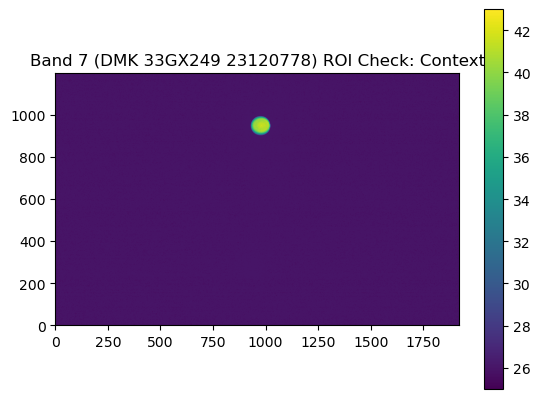

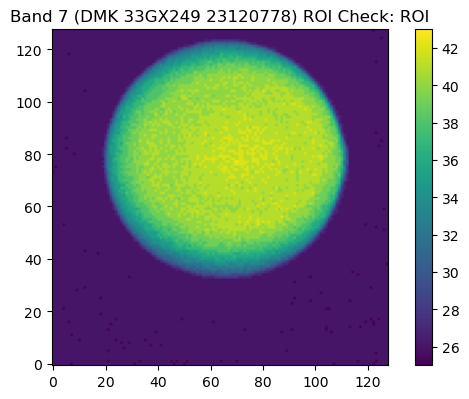

x: 240
y: 1184


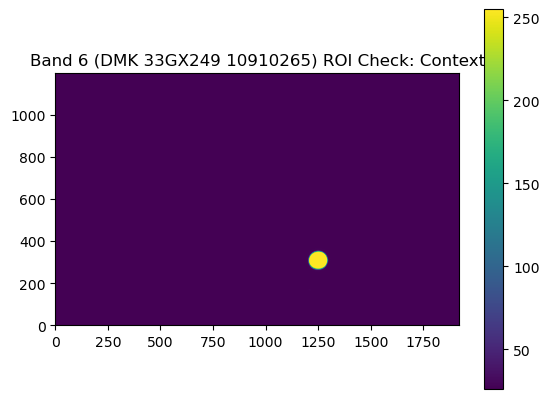

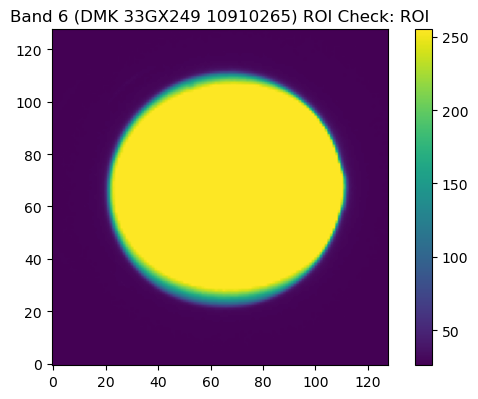

In [3]:
osc.find_camera_rois(cameras, roi_size=128)

# Calibration Target Imaging

- Prompt: Lens Cap removal, put calibration target in place
- Cycle over cameras. For each camera:
    - get optimal exposure and check ROI
    - capture repeat images of the calibration target
    - save the images
    - save the exposures used

Check:
1. The calibration target is in place
2. Lens cap is removed

In [ ]:
osc.prepare_reflectance_calibration(ic)

Find the optimal exposures for calibration target imaging.

In [4]:
calibration_exposures = osc.find_channel_exposures(cameras)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 0.0020000000949949026
Trial 0:
Quantile: 62.0, Target: 150
Exposure current Value: 0.0020000000949949026
Exposure Value set to 0.004838709719479084
Exposure set to 0.004838000051677227 (err of 7.098555685055782e-07
Trial 1:
Quantile: 114.0, Target: 150
Exposure current Value: 0.004838000051677227
Exposure Value set to 0.006365789566189051
Exposure set to 0.006364999804645777 (err of 7.897370347858049e-07
Trial 2:
Quantile: 142.0, Target: 150
Exposure current Value: 0.006364999804645777
Exposure Value set to 0.00672359112650156
Exposure set to 0.006723000202327967 (err of 5.911406077124121e-07
Trial 3:
Quantile: 148.0, Target: 150
Exposure current Value: 0.006723000202327967
Exposure Value set to 0.006813851650804281
Exposure set to 0.006812999956309795 (err of 8.51600103685124e-07
Trial 4:
Quantile: 150.0, Target: 150
Success after 4 trials
Ex

Check the calibration target images.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006812999956309795
Exposure Auto set to 0


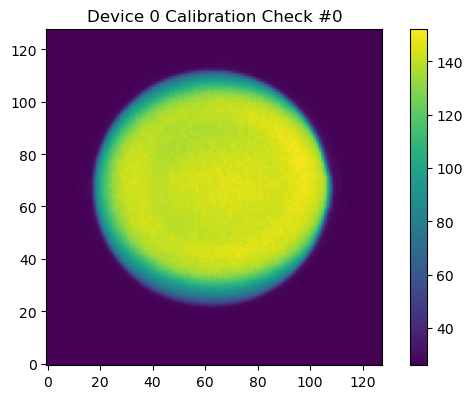

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.009384999983012676
Exposure Auto set to 0


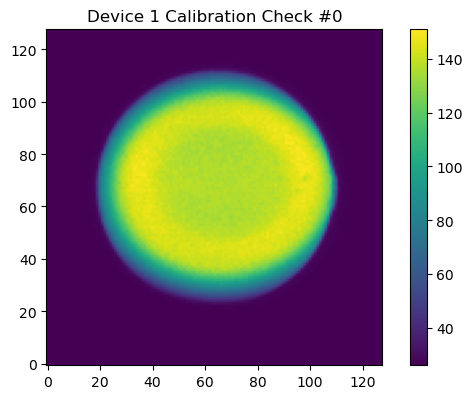

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.04147699847817421
Exposure Auto set to 0


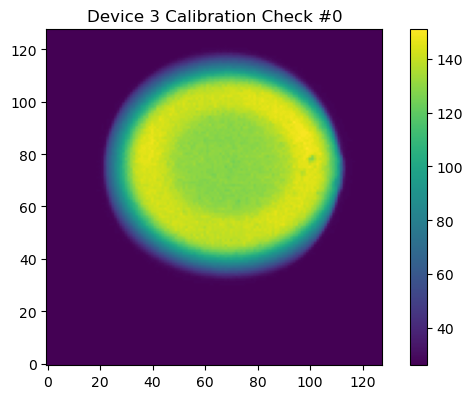

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.006498000118881464
Exposure Auto set to 0


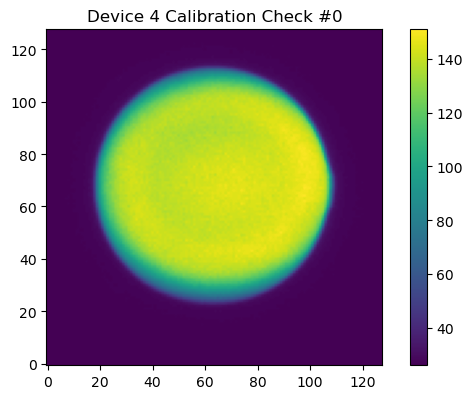

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.016553999856114388
Exposure Auto set to 0


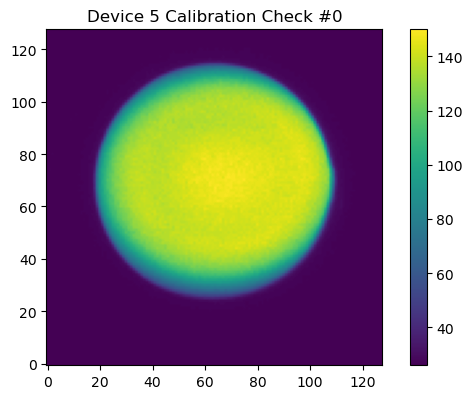

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.07606799900531769
Exposure Auto set to 0


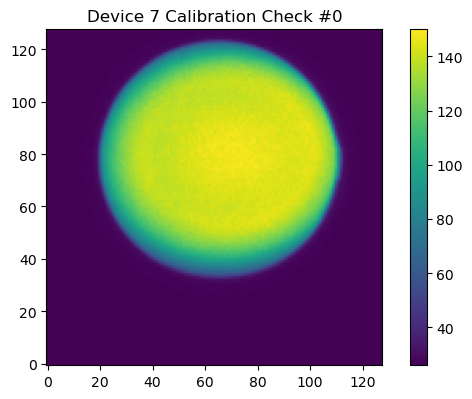

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.0029009999707341194
Exposure Auto set to 0


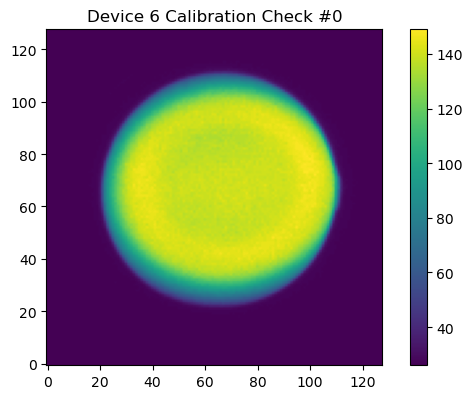

-----------------------------------


In [5]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='Calibration Check', 
    roi=True, 
    show_img=True)

Capture 10 repeat images of the calibration target in each channel.

In [6]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='reflectance_calibration', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006812999956309795
Exposure Auto set to 0
Exposure current Value: 0.006812000181525946
Image 0 written to ..\data\reflectance_calibration\0_650\650_0_img.tif
Exposure current Value: 0.006812000181525946
Image 1 written to ..\data\reflectance_calibration\0_650\650_1_img.tif
Exposure current Value: 0.006812000181525946
Image 2 written to ..\data\reflectance_calibration\0_650\650_2_img.tif
Exposure current Value: 0.006812000181525946
Image 3 written to ..\data\reflectance_calibration\0_650\650_3_img.tif
Exposure current Value: 0.006812000181525946
Image 4 written to ..\data\reflectance_calibration\0_650\650_4_img.tif
Exposure current Value: 0.006812000181525946
Image 5 written to ..\data\reflectance_calibration\0_650\650_5_img.tif
Exposure current Value: 0.006812000181525946
Image 6 written to ..\data\reflectance_calibration\0_650\650_6_img.tif
Exposure current Value: 0.006812000181525

Write the exposures to file.

In [7]:
osc.record_exposures(cameras, calibration_exposures, 'reflectance_calibration')

# Geometric Calibration Target Imaging

- Prompt: Lens Cap removal, put geometric calibration target in place
- Cycle over cameras. For each camera:
    - get optimal exposure and check ROI
    - capture repeat images of the geometric calibration target
    - save the images
    - save the exposures used

Check:
1. The geometric target is in place
2. Lens cap is removed

In [ ]:
osc.prepare_geometric_calibration(ic)

Find the optimal exposures for geometric calibration target imaging.

In [8]:
geometric_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 0.0020000000949949026
Trial 0:
Quantile: 52.0, Target: 150
Exposure current Value: 0.0020000000949949026
Exposure Value set to 0.005769230891019106
Exposure set to 0.005768999923020601 (err of 2.3112023392508896e-07
Trial 1:
Quantile: 102.0, Target: 150
Exposure current Value: 0.005768999923020601
Exposure Value set to 0.008483823388814926
Exposure set to 0.008483000099658966 (err of 8.233165478006149e-07
Trial 2:
Quantile: 138.0, Target: 150
Exposure current Value: 0.008483000099658966
Exposure Value set to 0.009220652282238007
Exposure set to 0.009220000356435776 (err of 6.51925802230835e-07
Trial 3:
Quantile: 147.0, Target: 150
Exposure current Value: 0.009220000356435776
Exposure Value set to 0.009408163838088512
Exposure set to 0.00940799992531538 (err of 1.6370370071842888e-07
Trial 4:
Quantile: 151.0, Target: 150
Success after 4 trials


Check the geometric calibration target images.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.00940799992531538
Exposure Auto set to 0


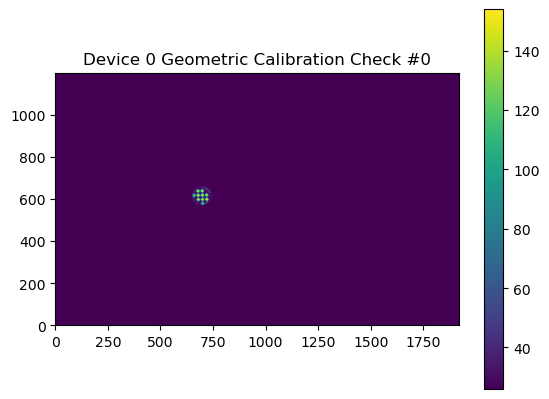

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.01271700020879507
Exposure Auto set to 0


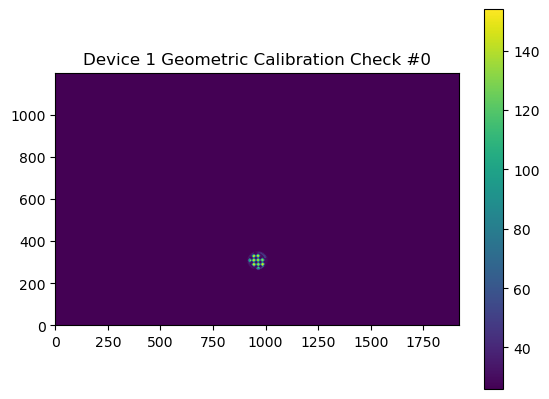

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.063230000436306
Exposure Auto set to 0


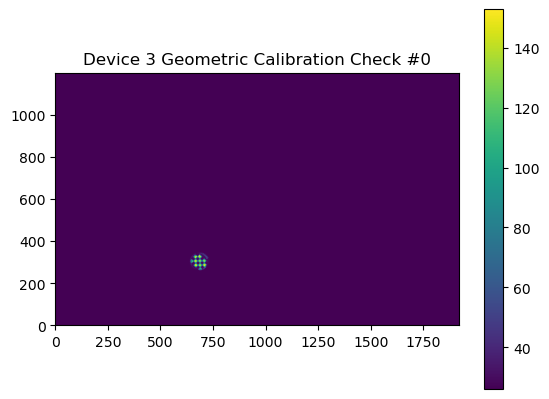

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.008438999764621258
Exposure Auto set to 0


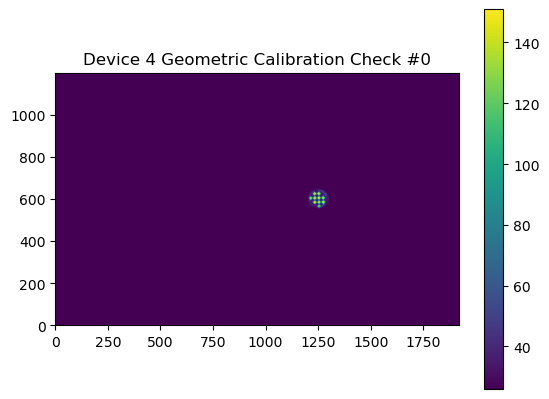

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.022273000329732895
Exposure Auto set to 0


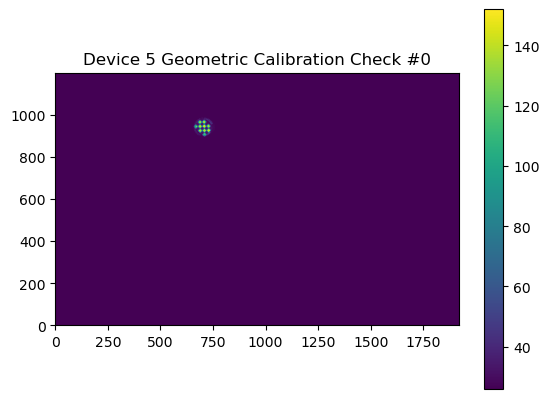

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.09885799884796143
Exposure Auto set to 0


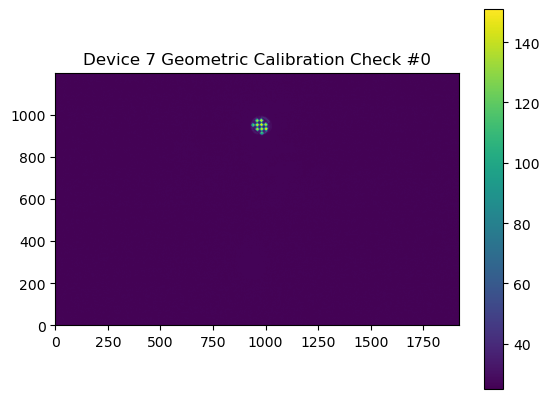

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.0038209999911487103
Exposure Auto set to 0


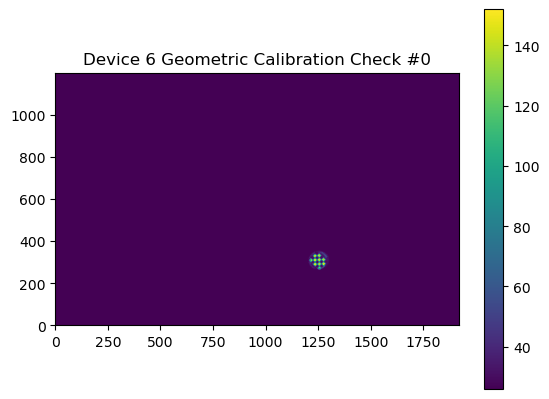

-----------------------------------


In [9]:
osc.capture_channel_images(
    cameras, 
    geometric_exposures, 
    subject='Geometric Calibration Check', 
    roi=False, 
    show_img=True)

Capture 10 repeat images of the geometric calibration target in each channel.

In [10]:
osc.capture_channel_images(
    cameras, 
    geometric_exposures, 
    subject='geometric_calibration', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.00940799992531538
Exposure Auto set to 0
Exposure current Value: 0.009406999684870243
Image 0 written to ..\data\geometric_calibration\0_650\650_0_img.tif
Exposure current Value: 0.009406999684870243
Image 1 written to ..\data\geometric_calibration\0_650\650_1_img.tif
Exposure current Value: 0.009406999684870243
Image 2 written to ..\data\geometric_calibration\0_650\650_2_img.tif
Exposure current Value: 0.009406999684870243
Image 3 written to ..\data\geometric_calibration\0_650\650_3_img.tif
Exposure current Value: 0.009406999684870243
Image 4 written to ..\data\geometric_calibration\0_650\650_4_img.tif
Exposure current Value: 0.009406999684870243
Image 5 written to ..\data\geometric_calibration\0_650\650_5_img.tif
Exposure current Value: 0.009406999684870243
Image 6 written to ..\data\geometric_calibration\0_650\650_6_img.tif
Exposure current Value: 0.009406999684870243
Image 7 wri

Write the exposures to file.

In [11]:
osc.record_exposures(cameras, geometric_exposures, 'geometric_calibration')

# Dark Calibration Target Imaging

For validating the spectral reflectance retrieval, and if neccessary for further reflectance calibration.

Find the optimal exposures for dark calibration target imaging.

In [13]:
dark_calibration_exposures = osc.find_channel_exposures(cameras, init_t_exp=1.0, limit=10)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 145.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.12170379608869553
Exposure set to 0.12170299887657166 (err of 7.938722084432914e-07
Trial 2:
Quantile: 149.0, Target: 150
Success after 2 trials
Exposure current Value: 0.12170299887657166
-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 106.

Check the calibration target images.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.12170299887657166
Exposure Auto set to 0


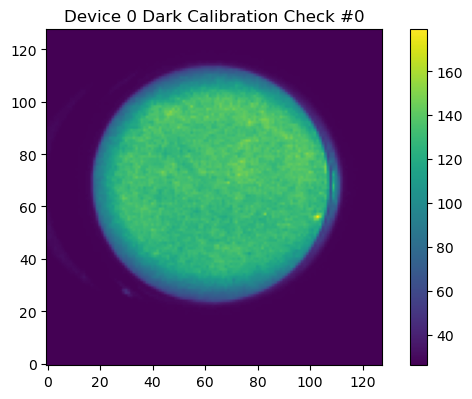

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.18208199739456177
Exposure Auto set to 0


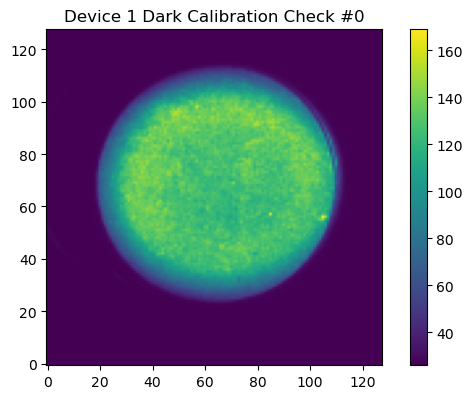

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.8403350114822388
Exposure Auto set to 0


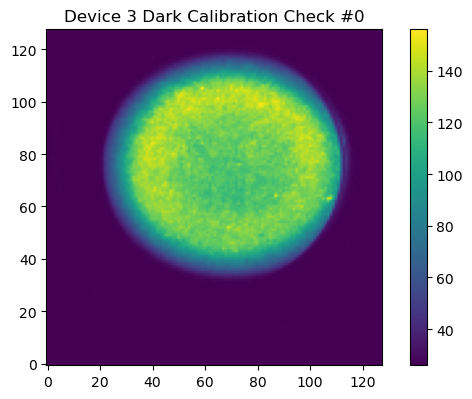

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.09231100231409073
Exposure Auto set to 0


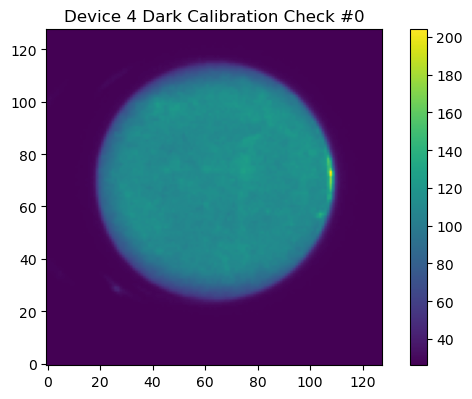

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.2750970125198364
Exposure Auto set to 0


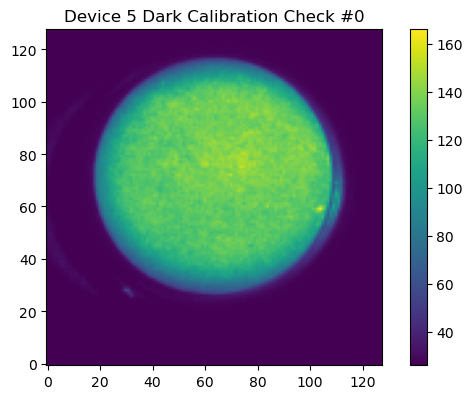

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 1.184522032737732
Exposure Auto set to 0


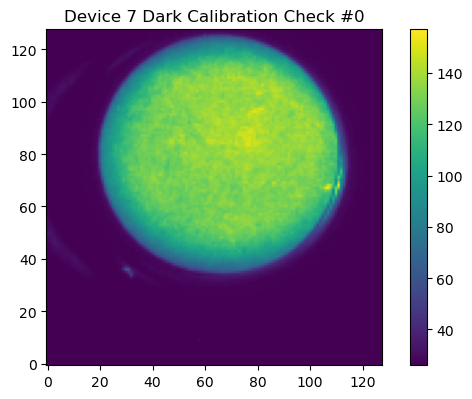

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.055323999375104904
Exposure Auto set to 0


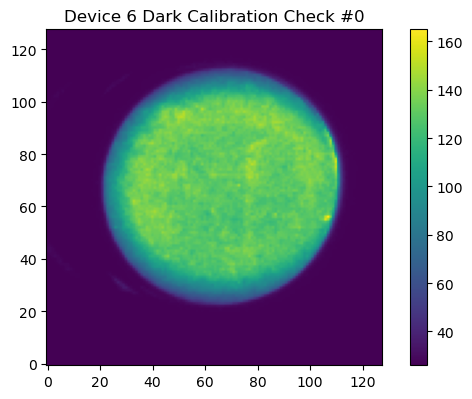

-----------------------------------


In [14]:
osc.capture_channel_images(
    cameras, 
    dark_calibration_exposures, 
    subject='Dark Calibration Check', 
    roi=True, 
    show_img=True)

Capture 10 repeat images of the calibration target in each channel.

In [15]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='dark_reflectance_calibration', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006812999956309795
Exposure Auto set to 0
Exposure current Value: 0.006812000181525946
Image 0 written to ..\data\dark_reflectance_calibration\0_650\650_0_img.tif
Exposure current Value: 0.006812000181525946
Image 1 written to ..\data\dark_reflectance_calibration\0_650\650_1_img.tif
Exposure current Value: 0.006812000181525946
Image 2 written to ..\data\dark_reflectance_calibration\0_650\650_2_img.tif
Exposure current Value: 0.006812000181525946
Image 3 written to ..\data\dark_reflectance_calibration\0_650\650_3_img.tif
Exposure current Value: 0.006812000181525946
Image 4 written to ..\data\dark_reflectance_calibration\0_650\650_4_img.tif
Exposure current Value: 0.006812000181525946
Image 5 written to ..\data\dark_reflectance_calibration\0_650\650_5_img.tif
Exposure current Value: 0.006812000181525946
Image 6 written to ..\data\dark_reflectance_calibration\0_650\650_6_img.tif
Exposu

Write the exposures to file.

In [16]:
osc.record_exposures(cameras, dark_calibration_exposures, 'dark_reflectance_calibration')

# Sample Imaging - from the Right

With Lamp Angle set to 300 degrees.

- Prompt: Lens Cap removal, put sample in place
- Cycle over cameras. For each camera:
    - get optimal exposure and check ROI
    - capture repeat images of the sample
    - save the images
    - save the exposures used

## Sample 1

Check:
1. The sample is in place
2. Lens cap is removed

In [ ]:
osc.prepare_sample_imaging(ic)

Find the optimal exposures for sample imaging.

In [17]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 255.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.01384082343429327
Exposure set to 0.01384000014513731 (err of 8.233439396411468e-07
Trial 2:
Quantile: 110.0, Target: 150
Exposure current Value: 0.01384000014513731
Exposure Value set to 0.01887272670865059
Exposure set to 0.01887200027704239 (err of 7.271935993959089e-07
Trial 3:
Quantile: 142.0, Target: 150
Exposure current Value: 0.01887200027704239
Exposure Value set to 0.019935211166739464
Exposure set to 0.0199350006878376 (err of 2.1087241844353066e-07
Trial 4:
Quantile: 148.0, Target: 150
Exposure current Value: 0.0199350006878376
Exposure Value set to 0.0

Check the sample images.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.020204000174999237
Exposure Auto set to 0


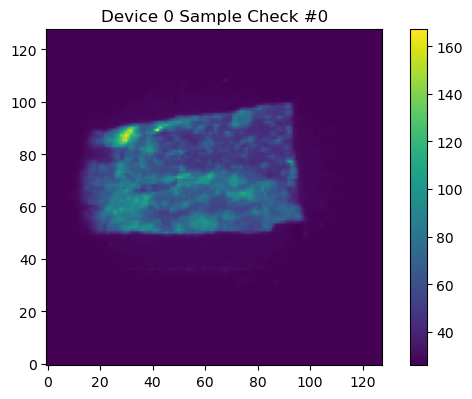

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.033906999975442886
Exposure Auto set to 0


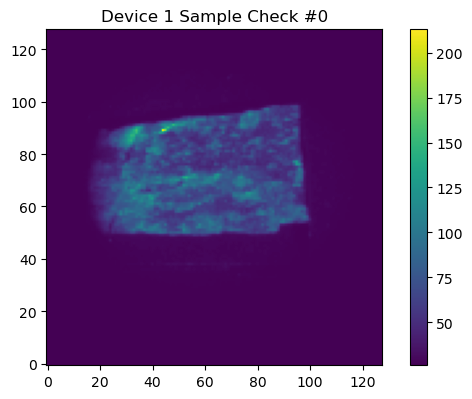

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.23573599755764008
Exposure Auto set to 0


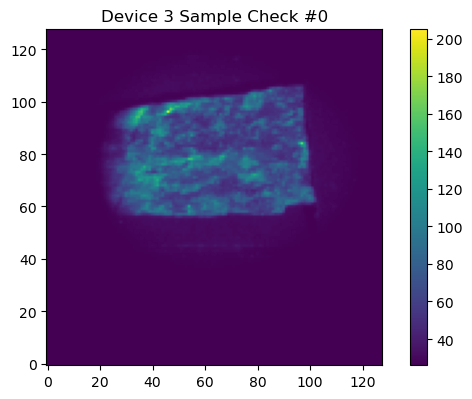

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.01842699944972992
Exposure Auto set to 0


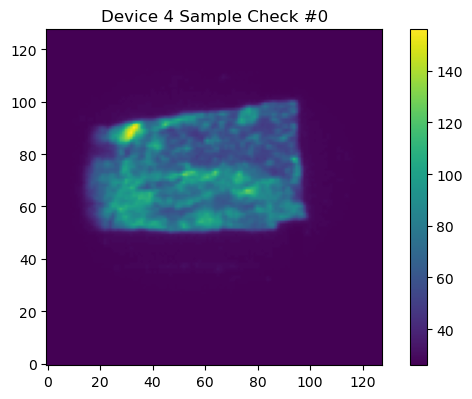

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.11764699965715408
Exposure Auto set to 0


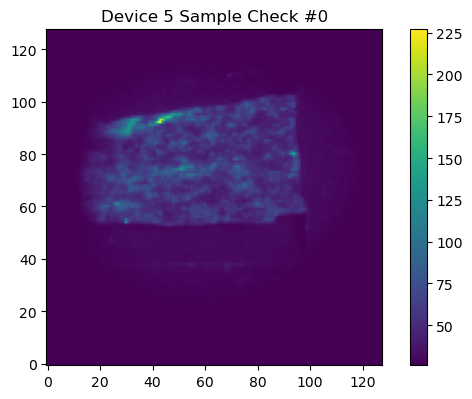

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.6525570154190063
Exposure Auto set to 0


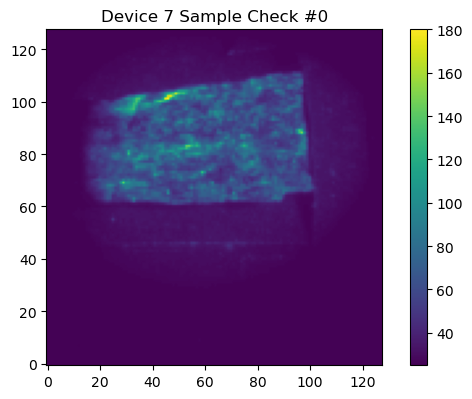

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.008905000053346157
Exposure Auto set to 0


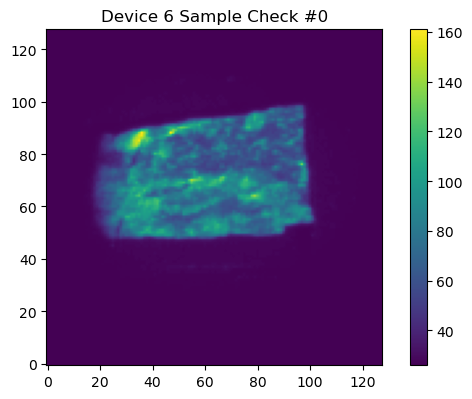

-----------------------------------


In [19]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

Capture 10 repeat images of the geometric calibration target in each channel.

In [20]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_1_r', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.020204000174999237
Exposure Auto set to 0
Exposure current Value: 0.020204000174999237
Image 0 written to ..\data\sample_1_r\0_650\650_0_img.tif
Exposure current Value: 0.020204000174999237
Image 1 written to ..\data\sample_1_r\0_650\650_1_img.tif
Exposure current Value: 0.020204000174999237
Image 2 written to ..\data\sample_1_r\0_650\650_2_img.tif
Exposure current Value: 0.020204000174999237
Image 3 written to ..\data\sample_1_r\0_650\650_3_img.tif
Exposure current Value: 0.020204000174999237
Image 4 written to ..\data\sample_1_r\0_650\650_4_img.tif
Exposure current Value: 0.020204000174999237
Image 5 written to ..\data\sample_1_r\0_650\650_5_img.tif
Exposure current Value: 0.020204000174999237
Image 6 written to ..\data\sample_1_r\0_650\650_6_img.tif
Exposure current Value: 0.020204000174999237
Image 7 written to ..\data\sample_1_r\0_650\650_7_img.tif
Exposure current Value: 0.020

Write the exposures to file.

In [21]:
osc.record_exposures(cameras, sample_exposures, 'sample_1_r')

## Sample 2

In [27]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 255.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.01384082343429327
Exposure set to 0.01384000014513731 (err of 8.233439396411468e-07
Trial 2:
Quantile: 54.0, Target: 150
Exposure current Value: 0.01384000014513731
Exposure Value set to 0.03844444453716278
Exposure set to 0.038444001227617264 (err of 4.43619986370547e-07
Trial 3:
Quantile: 106.0, Target: 150
Exposure current Value: 0.038444001227617264
Exposure Value set to 0.05440188944339752
Exposure set to 0.05440099909901619 (err of 8.894306308751543e-07
Trial 4:
Quantile: 138.0, Target: 150
Exposure current Value: 0.05440099909901619
Exposure Value set to 0.0

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.05993000045418739
Exposure Auto set to 0


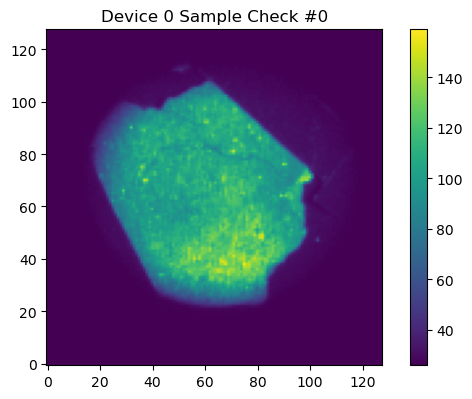

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.059401001781225204
Exposure Auto set to 0


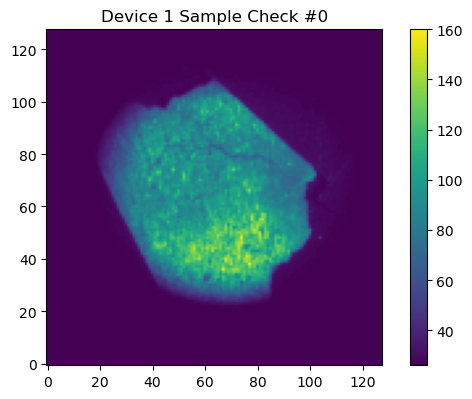

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.35420501232147217
Exposure Auto set to 0


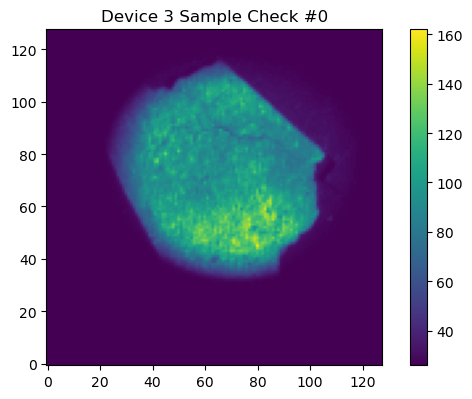

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.03281399980187416
Exposure Auto set to 0


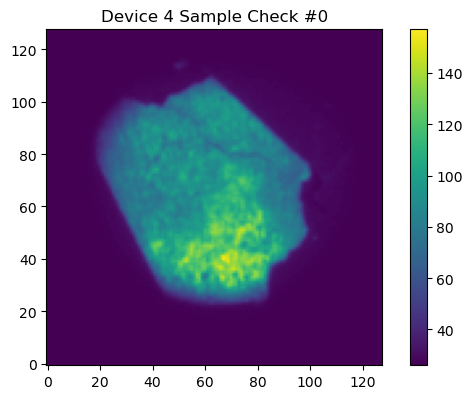

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.1867009997367859
Exposure Auto set to 0


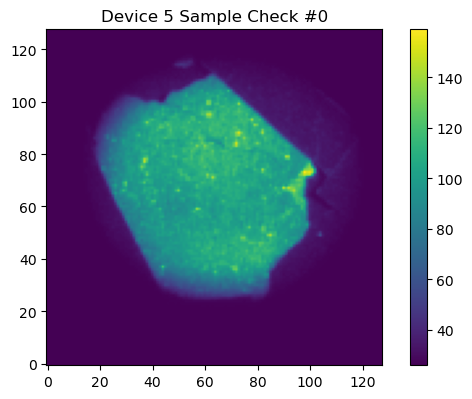

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.8696650266647339
Exposure Auto set to 0


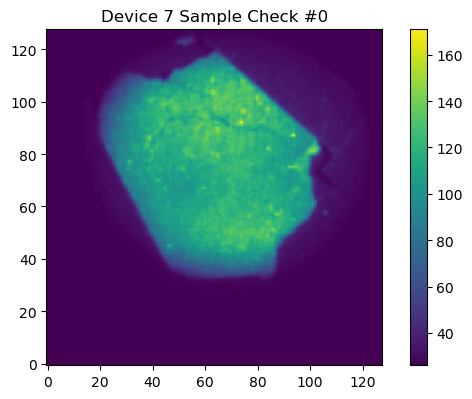

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.015135999768972397
Exposure Auto set to 0


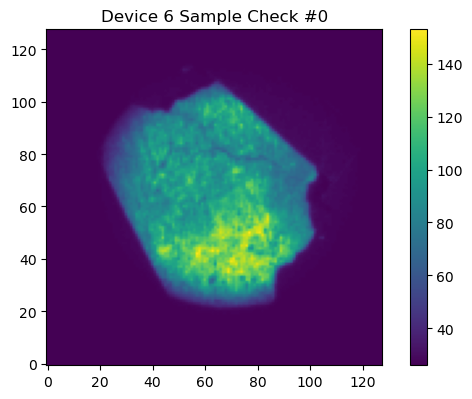

-----------------------------------


In [29]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [28]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_2_r', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.05993000045418739
Exposure Auto set to 0
Exposure current Value: 0.05993000045418739
Image 0 written to ..\data\sample_2_r\0_650\650_0_img.tif
Exposure current Value: 0.05993000045418739
Image 1 written to ..\data\sample_2_r\0_650\650_1_img.tif
Exposure current Value: 0.05993000045418739
Image 2 written to ..\data\sample_2_r\0_650\650_2_img.tif
Exposure current Value: 0.05993000045418739
Image 3 written to ..\data\sample_2_r\0_650\650_3_img.tif
Exposure current Value: 0.05993000045418739
Image 4 written to ..\data\sample_2_r\0_650\650_4_img.tif
Exposure current Value: 0.05993000045418739
Image 5 written to ..\data\sample_2_r\0_650\650_5_img.tif
Exposure current Value: 0.05993000045418739
Image 6 written to ..\data\sample_2_r\0_650\650_6_img.tif
Exposure current Value: 0.05993000045418739
Image 7 written to ..\data\sample_2_r\0_650\650_7_img.tif
Exposure current Value: 0.059930000454

In [30]:
osc.record_exposures(cameras, sample_exposures, 'sample_2_r')

## Sample 3

In [35]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 159.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.11098773777484894
Exposure set to 0.11098700016736984 (err of 7.353582472252596e-07
Trial 2:
Quantile: 151.0, Target: 150
Success after 2 trials
Exposure current Value: 0.11098700016736984
-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 121.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.11098700016736984
Exposure Auto set to 0


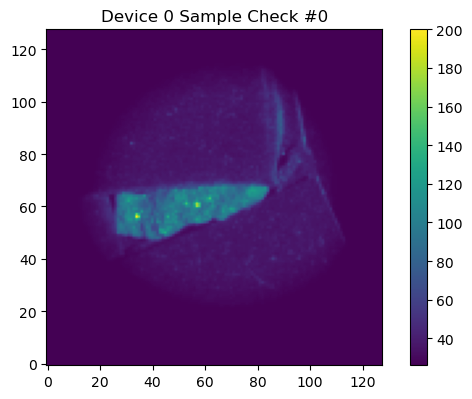

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.15191900730133057
Exposure Auto set to 0


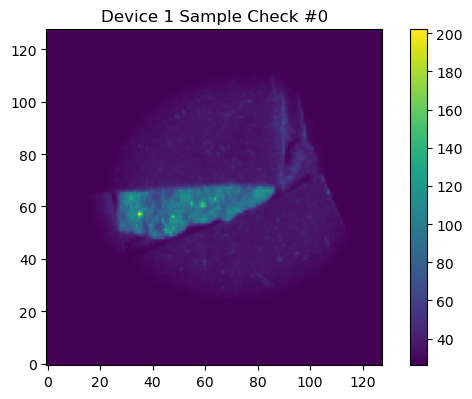

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.7582640051841736
Exposure Auto set to 0


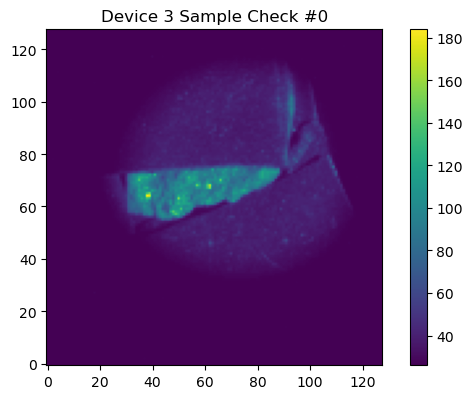

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.12867200374603271
Exposure Auto set to 0


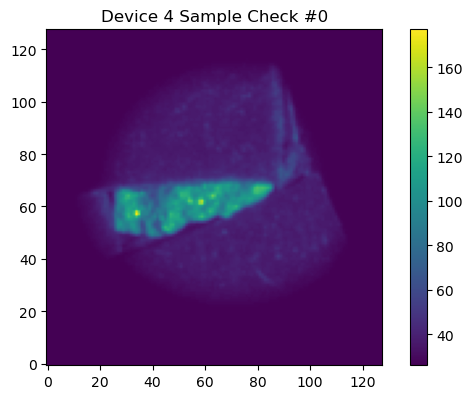

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.30542001128196716
Exposure Auto set to 0


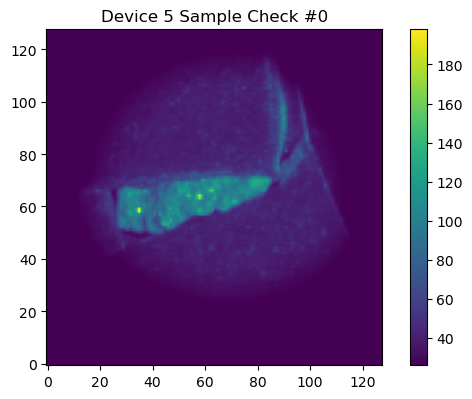

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 1.3315180540084839
Exposure Auto set to 0


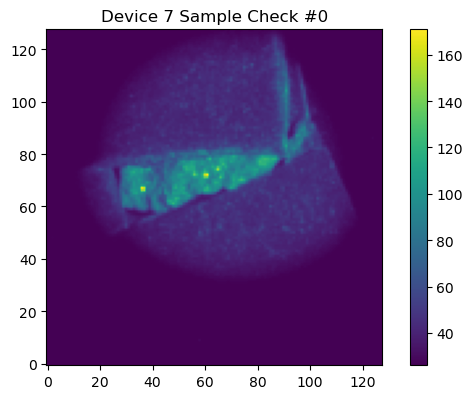

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.052149999886751175
Exposure Auto set to 0


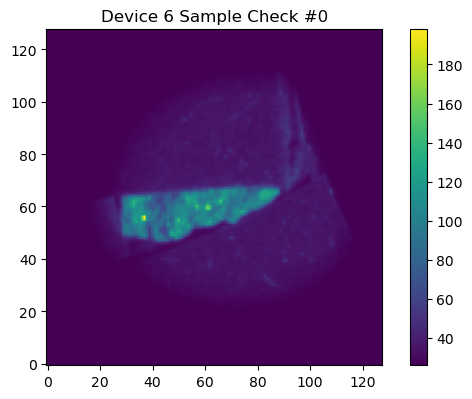

-----------------------------------


In [36]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [37]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_3_r', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.11098700016736984
Exposure Auto set to 0
Exposure current Value: 0.11098700016736984
Image 0 written to ..\data\sample_3_r\0_650\650_0_img.tif
Exposure current Value: 0.11098700016736984
Image 1 written to ..\data\sample_3_r\0_650\650_1_img.tif
Exposure current Value: 0.11098700016736984
Image 2 written to ..\data\sample_3_r\0_650\650_2_img.tif
Exposure current Value: 0.11098700016736984
Image 3 written to ..\data\sample_3_r\0_650\650_3_img.tif
Exposure current Value: 0.11098700016736984
Image 4 written to ..\data\sample_3_r\0_650\650_4_img.tif
Exposure current Value: 0.11098700016736984
Image 5 written to ..\data\sample_3_r\0_650\650_5_img.tif
Exposure current Value: 0.11098700016736984
Image 6 written to ..\data\sample_3_r\0_650\650_6_img.tif
Exposure current Value: 0.11098700016736984
Image 7 written to ..\data\sample_3_r\0_650\650_7_img.tif
Exposure current Value: 0.110987000167

In [38]:
osc.record_exposures(cameras, sample_exposures, 'sample_3_r')

## Sample 4

In [43]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 189.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.09337063133716583
Exposure set to 0.0933699980378151 (err of 6.366107198896298e-07
Trial 2:
Quantile: 156.0, Target: 150
Exposure current Value: 0.0933699980378151
Exposure Value set to 0.0897788405418396
Exposure set to 0.08977799862623215 (err of 8.456408977508545e-07
Trial 3:
Quantile: 152.0, Target: 150
Exposure current Value: 0.08977799862623215
Exposure Value set to 0.08859670907258987
Exposure set to 0.08859600126743317 (err of 7.079031906637168e-07
Trial 4:
Quantile: 149.0, Target: 150
Success after 4 trials
Exposure current Value: 0.08859600126743317
-----

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.08859600126743317
Exposure Auto set to 0


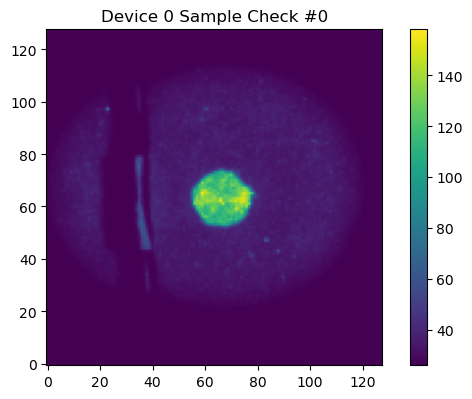

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.12420400232076645
Exposure Auto set to 0


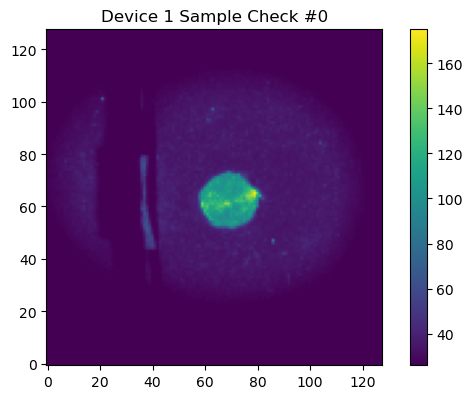

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.7215629816055298
Exposure Auto set to 0


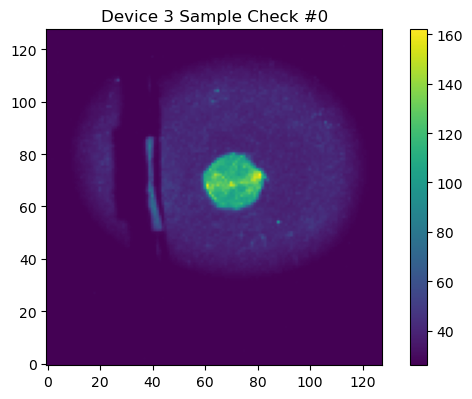

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.061556000262498856
Exposure Auto set to 0


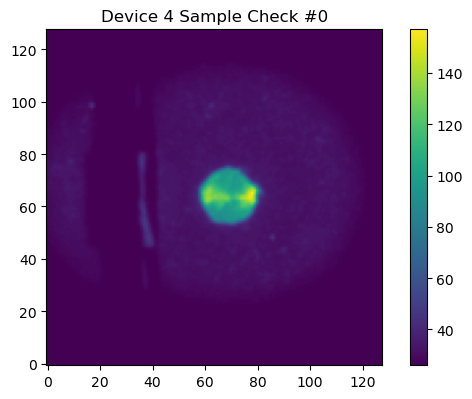

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.20475000143051147
Exposure Auto set to 0


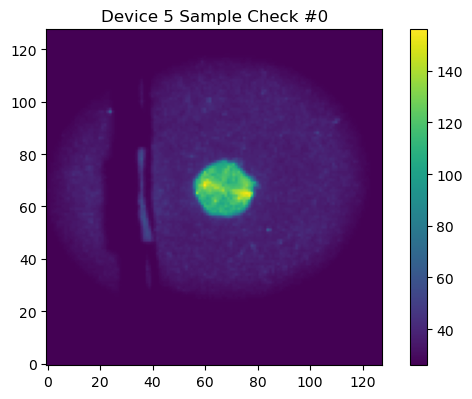

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.795054018497467
Exposure Auto set to 0


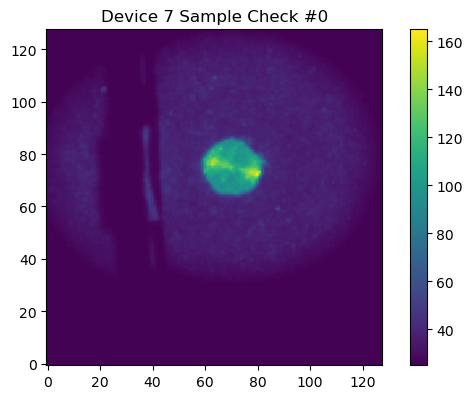

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.029438000172376633
Exposure Auto set to 0


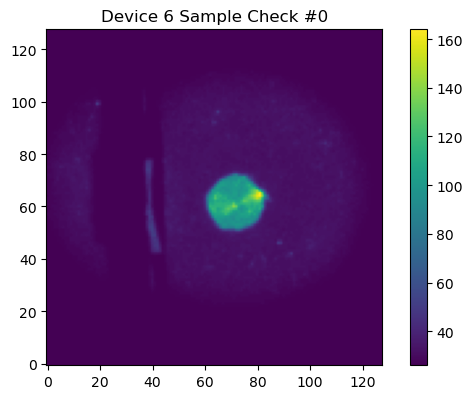

-----------------------------------


In [44]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [45]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_4_r', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.08859600126743317
Exposure Auto set to 0
Exposure current Value: 0.08859600126743317
Image 0 written to ..\data\sample_4_r\0_650\650_0_img.tif
Exposure current Value: 0.08859600126743317
Image 1 written to ..\data\sample_4_r\0_650\650_1_img.tif
Exposure current Value: 0.08859600126743317
Image 2 written to ..\data\sample_4_r\0_650\650_2_img.tif
Exposure current Value: 0.08859600126743317
Image 3 written to ..\data\sample_4_r\0_650\650_3_img.tif
Exposure current Value: 0.08859600126743317
Image 4 written to ..\data\sample_4_r\0_650\650_4_img.tif
Exposure current Value: 0.08859600126743317
Image 5 written to ..\data\sample_4_r\0_650\650_5_img.tif
Exposure current Value: 0.08859600126743317
Image 6 written to ..\data\sample_4_r\0_650\650_6_img.tif
Exposure current Value: 0.08859600126743317
Image 7 written to ..\data\sample_4_r\0_650\650_7_img.tif
Exposure current Value: 0.088596001267

In [46]:
osc.record_exposures(cameras, sample_exposures, 'sample_4_r')

## Sample 5

In [54]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 255.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.01384082343429327
Exposure set to 0.01384000014513731 (err of 8.233439396411468e-07
Trial 2:
Quantile: 110.0, Target: 150
Exposure current Value: 0.01384000014513731
Exposure Value set to 0.01887272670865059
Exposure set to 0.01887200027704239 (err of 7.271935993959089e-07
Trial 3:
Quantile: 140.0, Target: 150
Exposure current Value: 0.01887200027704239
Exposure Value set to 0.02022000029683113
Exposure set to 0.02022000029683113 (err of 0.0
Trial 4:
Quantile: 148.0, Target: 150
Exposure current Value: 0.02022000029683113
Exposure Value set to 0.020493242889642715


-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.020493000745773315
Exposure Auto set to 0


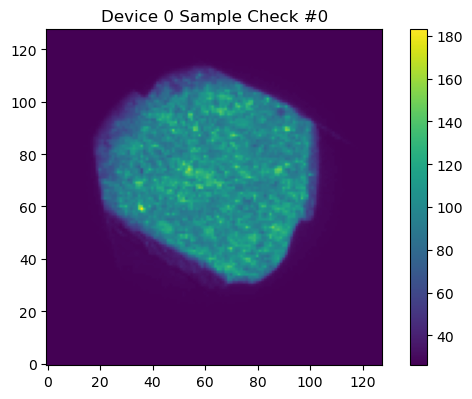

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.02983199991285801
Exposure Auto set to 0


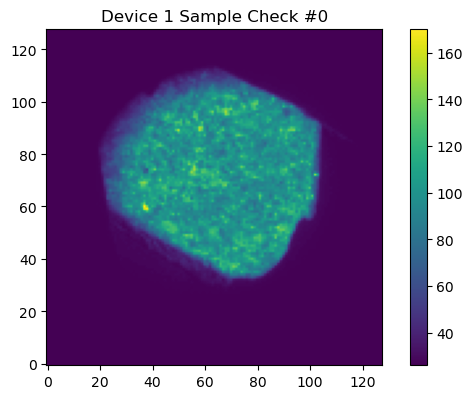

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.14722099900245667
Exposure Auto set to 0


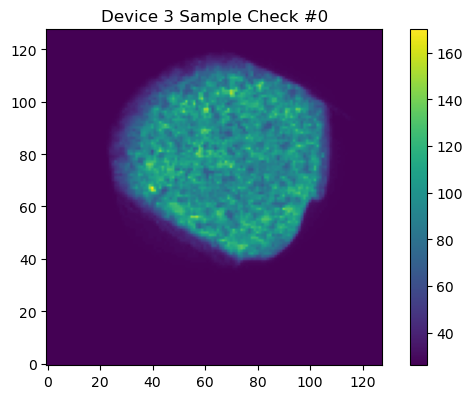

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.015356999821960926
Exposure Auto set to 0


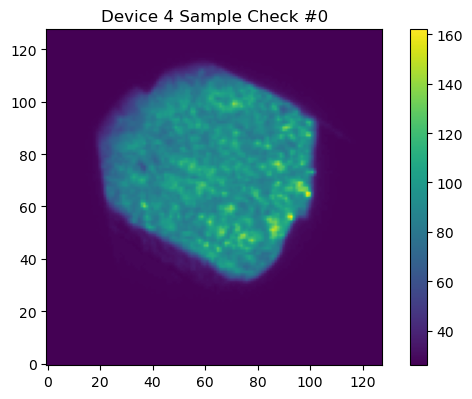

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.052400000393390656
Exposure Auto set to 0


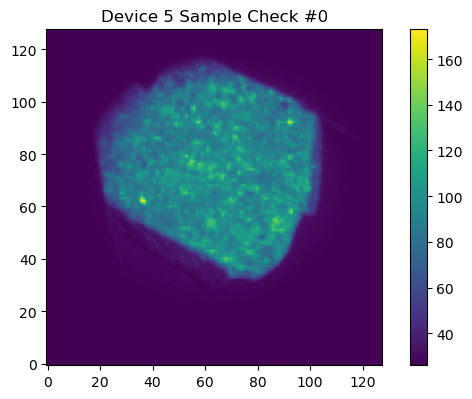

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.18942700326442719
Exposure Auto set to 0


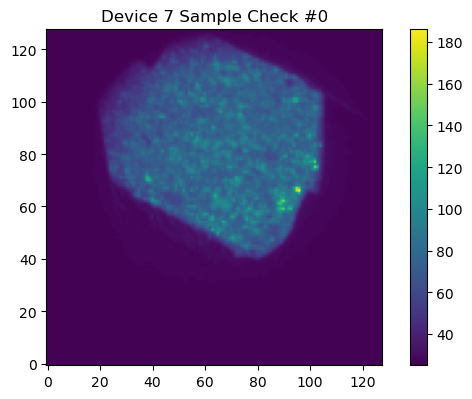

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.007974999956786633
Exposure Auto set to 0


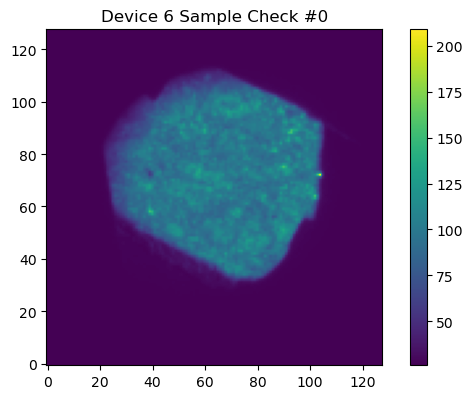

-----------------------------------


In [55]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [56]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_5_r', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.020493000745773315
Exposure Auto set to 0
Exposure current Value: 0.020493000745773315
Image 0 written to ..\data\sample_5_r\0_650\650_0_img.tif
Exposure current Value: 0.020493000745773315
Image 1 written to ..\data\sample_5_r\0_650\650_1_img.tif
Exposure current Value: 0.020493000745773315
Image 2 written to ..\data\sample_5_r\0_650\650_2_img.tif
Exposure current Value: 0.020493000745773315
Image 3 written to ..\data\sample_5_r\0_650\650_3_img.tif
Exposure current Value: 0.020493000745773315
Image 4 written to ..\data\sample_5_r\0_650\650_4_img.tif
Exposure current Value: 0.020493000745773315
Image 5 written to ..\data\sample_5_r\0_650\650_5_img.tif
Exposure current Value: 0.020493000745773315
Image 6 written to ..\data\sample_5_r\0_650\650_6_img.tif
Exposure current Value: 0.020493000745773315
Image 7 written to ..\data\sample_5_r\0_650\650_7_img.tif
Exposure current Value: 0.020

In [57]:
osc.record_exposures(cameras, sample_exposures, 'sample_5_r')

# Sample Imaging - from the Left

With Lamp Angle set to 300 - 60 = 240 degrees.

- Prompt: Lens Cap removal, put sample in place
- Cycle over cameras. For each camera:
    - get optimal exposure and check ROI
    - capture repeat images of the sample
    - save the images
    - save the exposures used

## Sample 1

Check:
1. The sample is in place
2. Lens cap is removed

In [ ]:
osc.prepare_sample_imaging(ic)

Find the optimal exposures for sample imaging.

In [22]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 255.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.01384082343429327
Exposure set to 0.01384000014513731 (err of 8.233439396411468e-07
Trial 2:
Quantile: 133.0, Target: 150
Exposure current Value: 0.01384000014513731
Exposure Value set to 0.015609023161232471
Exposure set to 0.015608999878168106 (err of 2.2841911567067497e-08
Trial 3:
Quantile: 145.0, Target: 150
Exposure current Value: 0.015608999878168106
Exposure Value set to 0.01614724099636078
Exposure set to 0.016147000715136528 (err of 2.4053814082561353e-07
Trial 4:
Quantile: 150.0, Target: 150
Success after 4 trials
Exposure current Value: 0.01614700071513

Check the sample images.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.016147000715136528
Exposure Auto set to 0


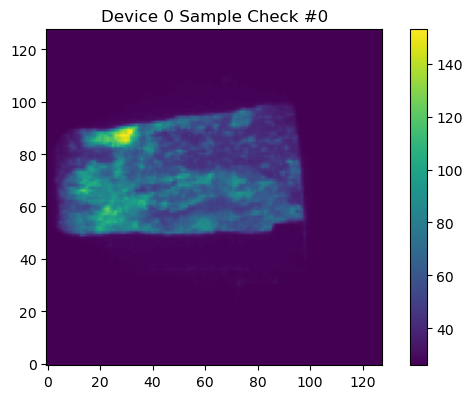

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.026329999789595604
Exposure Auto set to 0


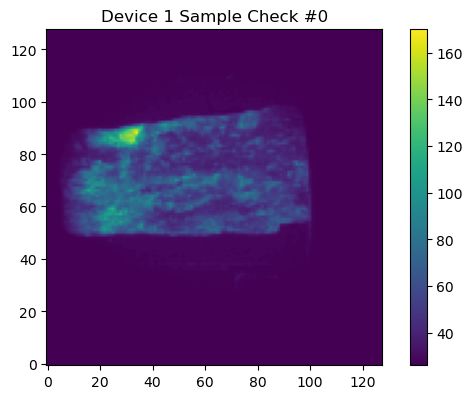

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.1323390007019043
Exposure Auto set to 0


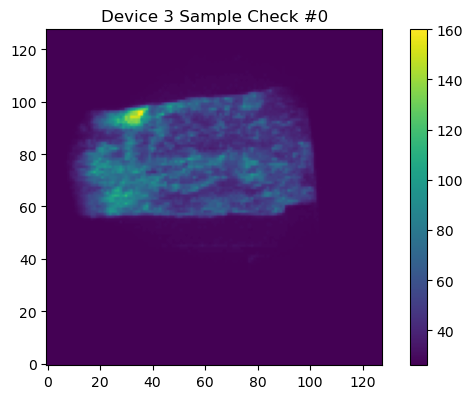

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.018288999795913696
Exposure Auto set to 0


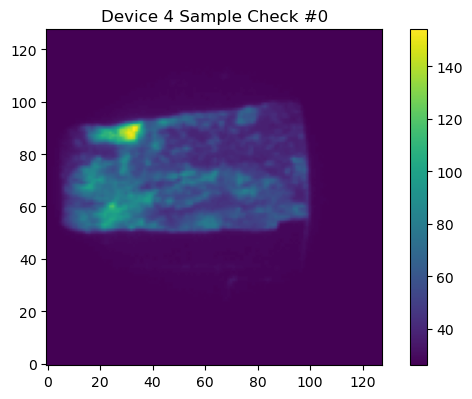

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.11609899997711182
Exposure Auto set to 0


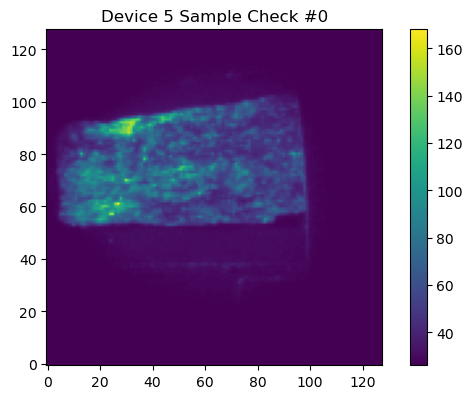

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.7730349898338318
Exposure Auto set to 0


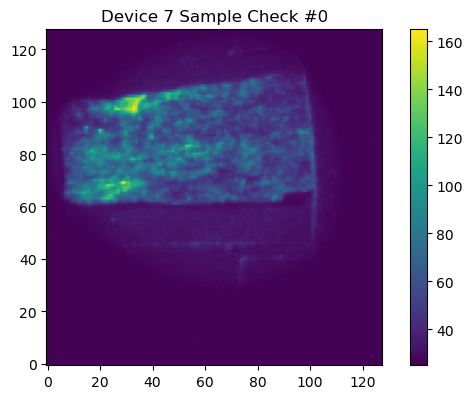

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.00785099994391203
Exposure Auto set to 0


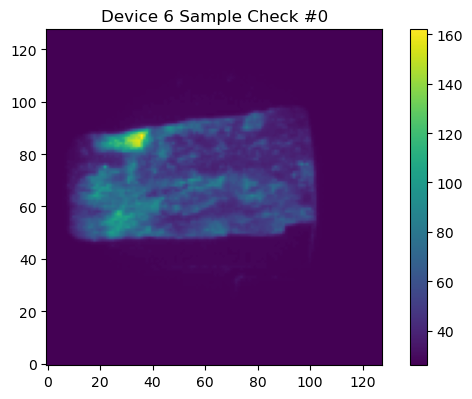

-----------------------------------


In [24]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

Capture 10 repeat images of the geometric calibration target in each channel.

In [25]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_1_l', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.016147000715136528
Exposure Auto set to 0
Exposure current Value: 0.016147000715136528
Image 0 written to ..\data\sample_1_l\0_650\650_0_img.tif
Exposure current Value: 0.016147000715136528
Image 1 written to ..\data\sample_1_l\0_650\650_1_img.tif
Exposure current Value: 0.016147000715136528
Image 2 written to ..\data\sample_1_l\0_650\650_2_img.tif
Exposure current Value: 0.016147000715136528
Image 3 written to ..\data\sample_1_l\0_650\650_3_img.tif
Exposure current Value: 0.016147000715136528
Image 4 written to ..\data\sample_1_l\0_650\650_4_img.tif
Exposure current Value: 0.016147000715136528
Image 5 written to ..\data\sample_1_l\0_650\650_5_img.tif
Exposure current Value: 0.016147000715136528
Image 6 written to ..\data\sample_1_l\0_650\650_6_img.tif
Exposure current Value: 0.016147000715136528
Image 7 written to ..\data\sample_1_l\0_650\650_7_img.tif
Exposure current Value: 0.016

Write the exposures to file.

In [26]:
osc.record_exposures(cameras, sample_exposures, 'sample_1_l')

## Sample 2

In [31]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 255.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.01384082343429327
Exposure set to 0.01384000014513731 (err of 8.233439396411468e-07
Trial 2:
Quantile: 70.0, Target: 150
Exposure current Value: 0.01384000014513731
Exposure Value set to 0.029657144099473953
Exposure set to 0.029657000675797462 (err of 1.424923539161682e-07
Trial 3:
Quantile: 121.0, Target: 150
Exposure current Value: 0.029657000675797462
Exposure Value set to 0.036764875054359436
Exposure set to 0.0367639996111393 (err of 8.772596840067592e-07
Trial 4:
Quantile: 144.0, Target: 150
Exposure current Value: 0.0367639996111393
Exposure Value set to 0.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.03829500079154968
Exposure Auto set to 0


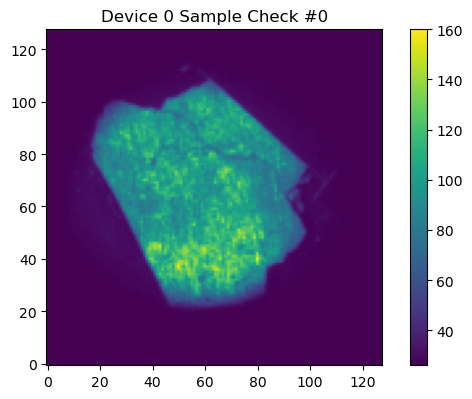

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.0896809995174408
Exposure Auto set to 0


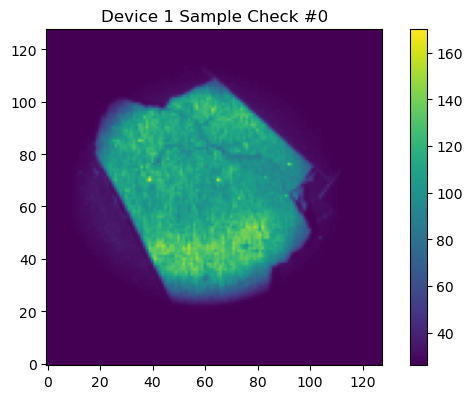

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.32589399814605713
Exposure Auto set to 0


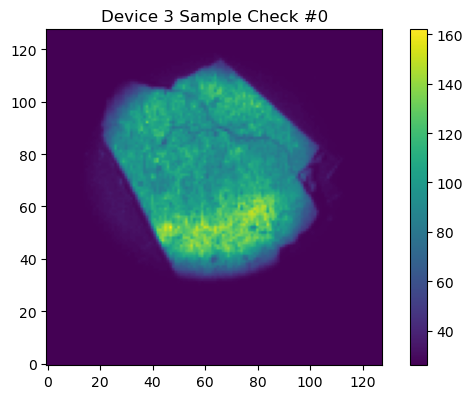

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.062233999371528625
Exposure Auto set to 0


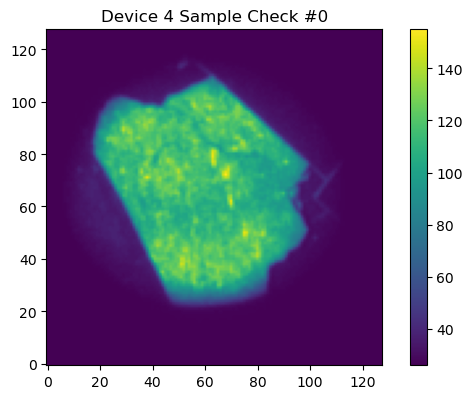

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.15667499601840973
Exposure Auto set to 0


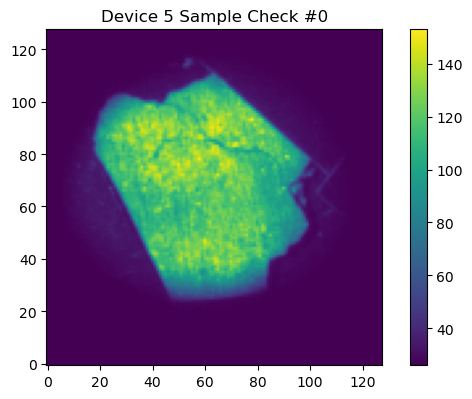

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.8109560012817383
Exposure Auto set to 0


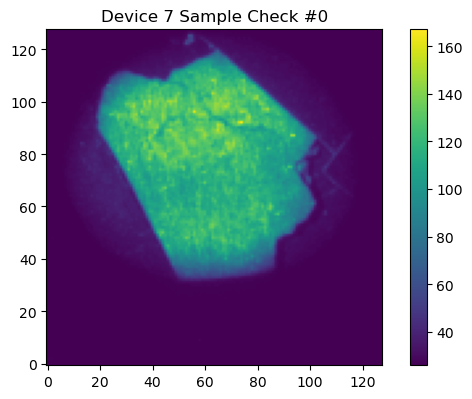

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.03266499936580658
Exposure Auto set to 0


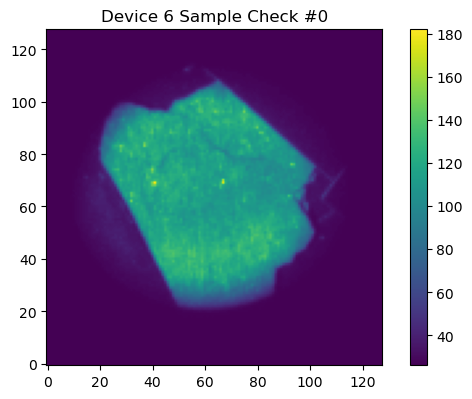

-----------------------------------


In [32]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [33]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_2_l', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.03829500079154968
Exposure Auto set to 0
Exposure current Value: 0.03829500079154968
Image 0 written to ..\data\sample_2_l\0_650\650_0_img.tif
Exposure current Value: 0.03829500079154968
Image 1 written to ..\data\sample_2_l\0_650\650_1_img.tif
Exposure current Value: 0.03829500079154968
Image 2 written to ..\data\sample_2_l\0_650\650_2_img.tif
Exposure current Value: 0.03829500079154968
Image 3 written to ..\data\sample_2_l\0_650\650_3_img.tif
Exposure current Value: 0.03829500079154968
Image 4 written to ..\data\sample_2_l\0_650\650_4_img.tif
Exposure current Value: 0.03829500079154968
Image 5 written to ..\data\sample_2_l\0_650\650_5_img.tif
Exposure current Value: 0.03829500079154968
Image 6 written to ..\data\sample_2_l\0_650\650_6_img.tif
Exposure current Value: 0.03829500079154968
Image 7 written to ..\data\sample_2_l\0_650\650_7_img.tif
Exposure current Value: 0.038295000791

In [34]:
osc.record_exposures(cameras, sample_exposures, 'sample_2_l')

## Sample 3

In [39]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 186.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.09487660974264145
Exposure set to 0.0948759987950325 (err of 6.138317046600061e-07
Trial 2:
Quantile: 156.0, Target: 150
Exposure current Value: 0.0948759987950325
Exposure Value set to 0.09122692048549652
Exposure set to 0.0912259966135025 (err of 9.253047979773665e-07
Trial 3:
Quantile: 152.0, Target: 150
Exposure current Value: 0.0912259966135025
Exposure Value set to 0.0900256559252739
Exposure set to 0.09002500027418137 (err of 6.542786171459536e-07
Trial 4:
Quantile: 150.0, Target: 150
Success after 4 trials
Exposure current Value: 0.09002500027418137
-------

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.09002500027418137
Exposure Auto set to 0


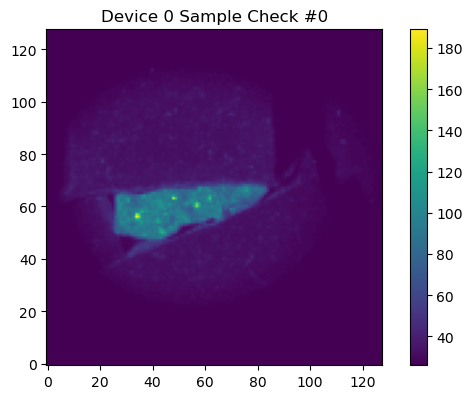

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.1296049952507019
Exposure Auto set to 0


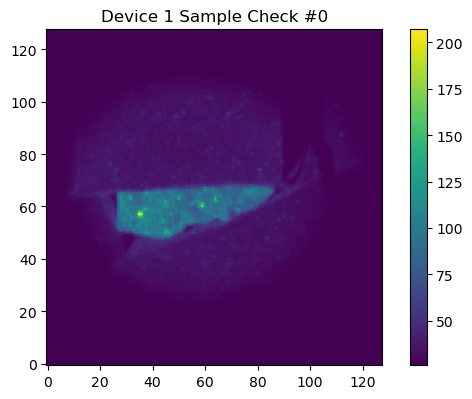

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.7165600061416626
Exposure Auto set to 0


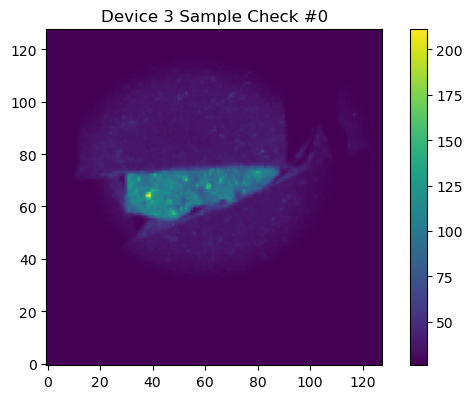

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.09943000227212906
Exposure Auto set to 0


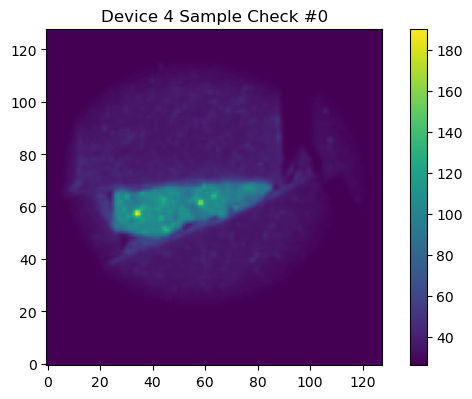

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.2626500129699707
Exposure Auto set to 0


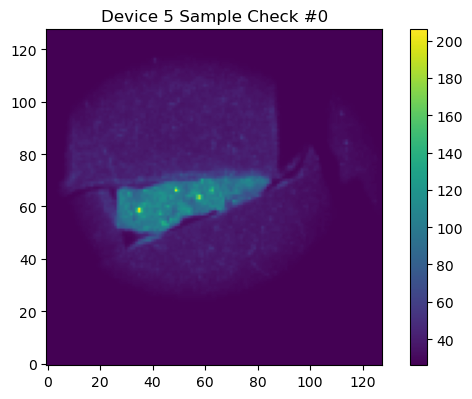

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 1.0
Exposure Auto set to 0


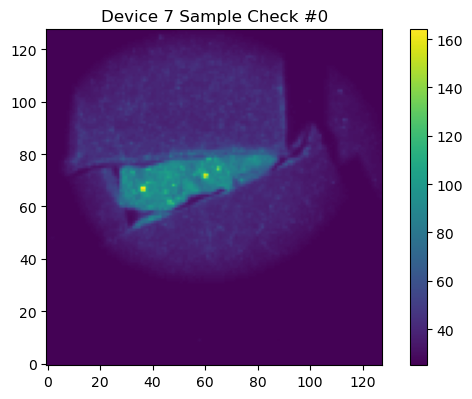

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.03939700126647949
Exposure Auto set to 0


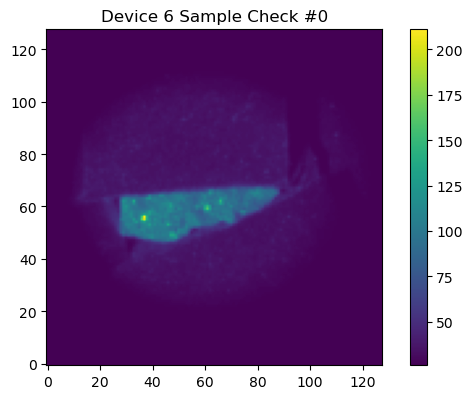

-----------------------------------


In [40]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [41]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_3_l', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.09002500027418137
Exposure Auto set to 0
Exposure current Value: 0.09002500027418137
Image 0 written to ..\data\sample_3_l\0_650\650_0_img.tif
Exposure current Value: 0.09002500027418137
Image 1 written to ..\data\sample_3_l\0_650\650_1_img.tif
Exposure current Value: 0.09002500027418137
Image 2 written to ..\data\sample_3_l\0_650\650_2_img.tif
Exposure current Value: 0.09002500027418137
Image 3 written to ..\data\sample_3_l\0_650\650_3_img.tif
Exposure current Value: 0.09002500027418137
Image 4 written to ..\data\sample_3_l\0_650\650_4_img.tif
Exposure current Value: 0.09002500027418137
Image 5 written to ..\data\sample_3_l\0_650\650_5_img.tif
Exposure current Value: 0.09002500027418137
Image 6 written to ..\data\sample_3_l\0_650\650_6_img.tif
Exposure current Value: 0.09002500027418137
Image 7 written to ..\data\sample_3_l\0_650\650_7_img.tif
Exposure current Value: 0.090025000274

In [42]:
osc.record_exposures(cameras, sample_exposures, 'sample_3_l')

## Sample 4

In [50]:
sample_exposures = osc.load_exposures(cameras, 'sample_4_r')

Issues with autoexposure on Device 3, so have just loaded up exposures from right-oriented lamp imaging of this sample.

In [49]:
# sample_exposures = osc.find_channel_exposures(cameras, roi=True, init_t_exp=0.7)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 0.699999988079071
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 0.6999989748001099
Exposure Value set to 0.08235281705856323
Exposure set to 0.08235199749469757 (err of 8.230700212358277e-07
Trial 1:
Quantile: 181.0, Target: 150
Exposure current Value: 0.08235199749469757
Exposure Value set to 0.06824751198291779
Exposure set to 0.0682469978928566 (err of 5.138430806128635e-07
Trial 2:
Quantile: 155.0, Target: 150
Exposure current Value: 0.0682469978928566
Exposure Value set to 0.06604548543691635
Exposure set to 0.06604500114917755 (err of 4.806826191527946e-07
Trial 3:
Quantile: 151.0, Target: 150
Success after 3 trials
Exposure current Value: 0.06604500114917755
-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposu

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.08859600126743317
Exposure Auto set to 0


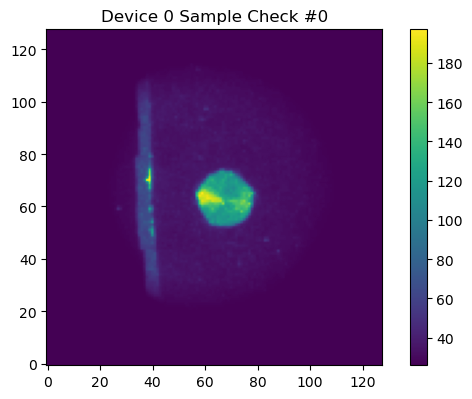

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.12420400232076645
Exposure Auto set to 0


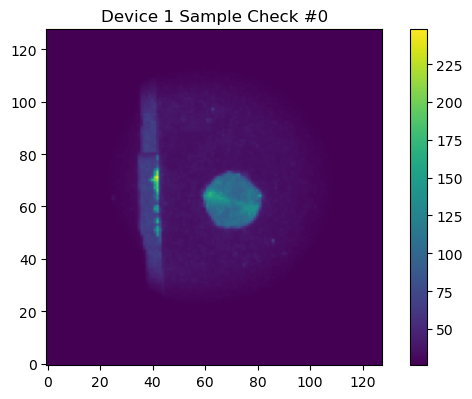

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.7215629816055298
Exposure Auto set to 0


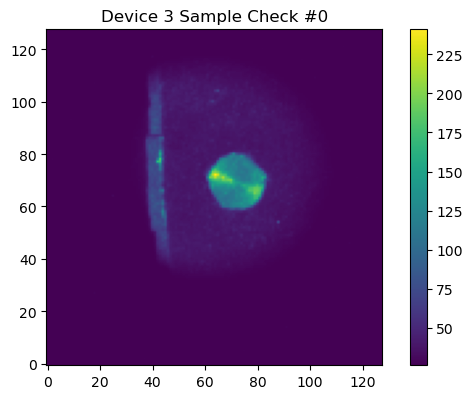

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.061556000262498856
Exposure Auto set to 0


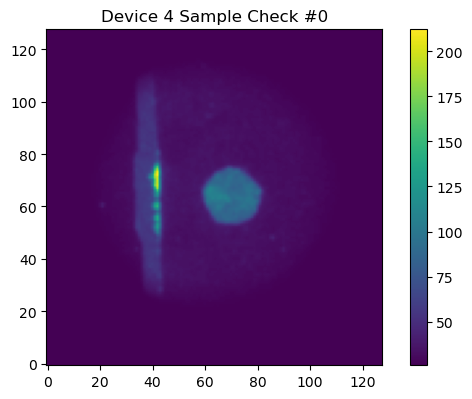

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.20475000143051147
Exposure Auto set to 0


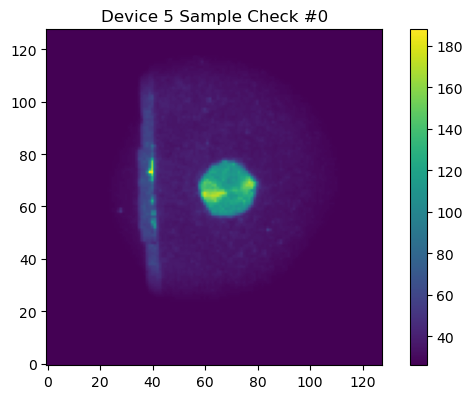

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.795054018497467
Exposure Auto set to 0


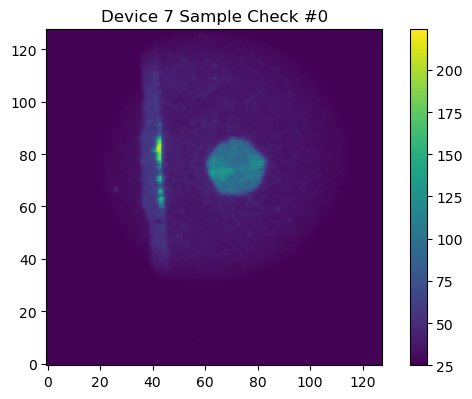

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.029438000172376633
Exposure Auto set to 0


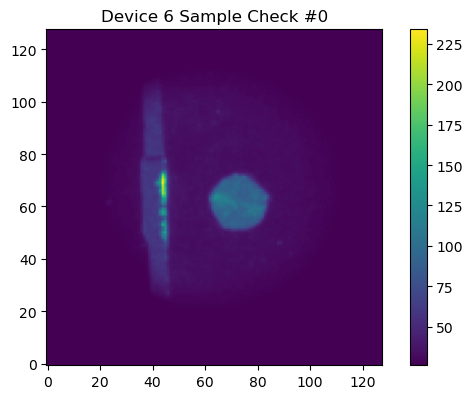

-----------------------------------


In [51]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [52]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_4_l', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.08859600126743317
Exposure Auto set to 0
Exposure current Value: 0.08859600126743317
Image 0 written to ..\data\sample_4_l\0_650\650_0_img.tif
Exposure current Value: 0.08859600126743317
Image 1 written to ..\data\sample_4_l\0_650\650_1_img.tif
Exposure current Value: 0.08859600126743317
Image 2 written to ..\data\sample_4_l\0_650\650_2_img.tif
Exposure current Value: 0.08859600126743317
Image 3 written to ..\data\sample_4_l\0_650\650_3_img.tif
Exposure current Value: 0.08859600126743317
Image 4 written to ..\data\sample_4_l\0_650\650_4_img.tif
Exposure current Value: 0.08859600126743317
Image 5 written to ..\data\sample_4_l\0_650\650_5_img.tif
Exposure current Value: 0.08859600126743317
Image 6 written to ..\data\sample_4_l\0_650\650_6_img.tif
Exposure current Value: 0.08859600126743317
Image 7 written to ..\data\sample_4_l\0_650\650_7_img.tif
Exposure current Value: 0.088596001267

In [53]:
osc.record_exposures(cameras, sample_exposures, 'sample_4_l')

## Sample 5

In [58]:
sample_exposures = osc.find_channel_exposures(cameras, roi=True)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 255.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.01384082343429327
Exposure set to 0.01384000014513731 (err of 8.233439396411468e-07
Trial 2:
Quantile: 130.0, Target: 150
Exposure current Value: 0.01384000014513731
Exposure Value set to 0.015969231724739075
Exposure set to 0.01596900075674057 (err of 2.301799563245166e-07
Trial 3:
Quantile: 146.0, Target: 150
Exposure current Value: 0.01596900075674057
Exposure Value set to 0.016406508162617683
Exposure set to 0.016405999660491943 (err of 5.07966296314083e-07
Trial 4:
Quantile: 149.0, Target: 150
Success after 4 trials
Exposure current Value: 0.016405999660491943

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.016405999660491943
Exposure Auto set to 0


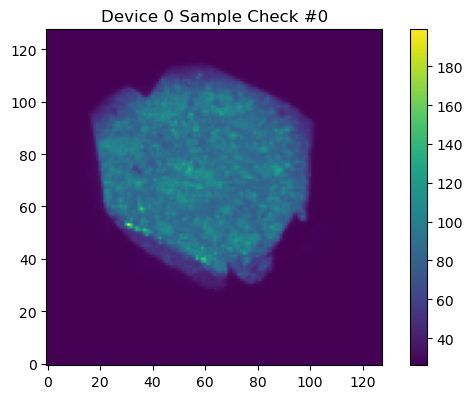

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.028396999463438988
Exposure Auto set to 0


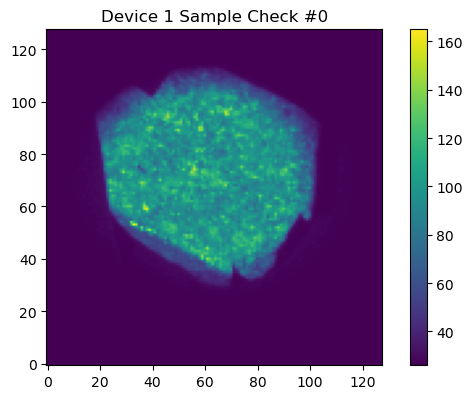

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.08682399988174438
Exposure Auto set to 0


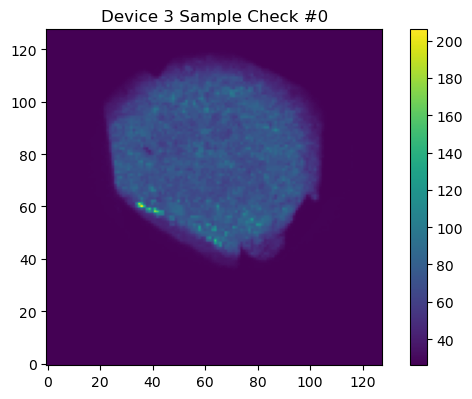

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.019977999851107597
Exposure Auto set to 0


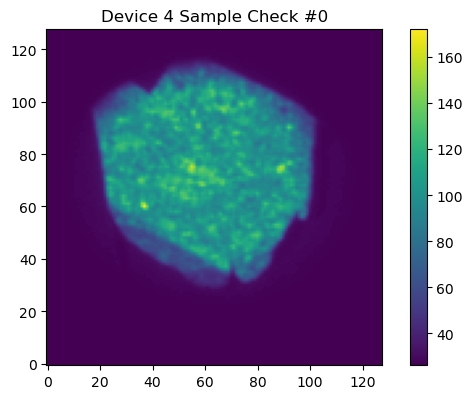

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.050905000418424606
Exposure Auto set to 0


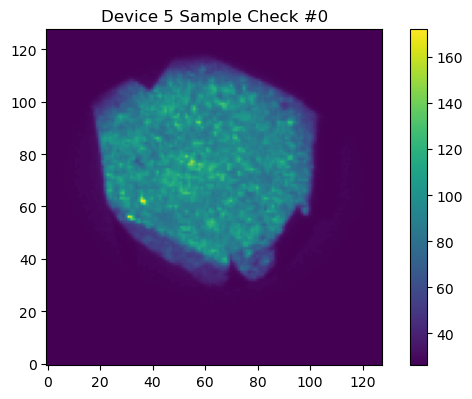

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.2931709885597229
Exposure Auto set to 0


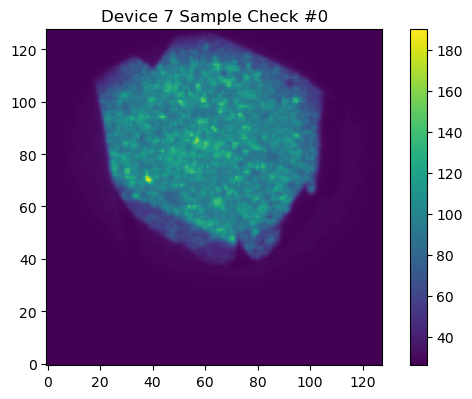

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.008957999758422375
Exposure Auto set to 0


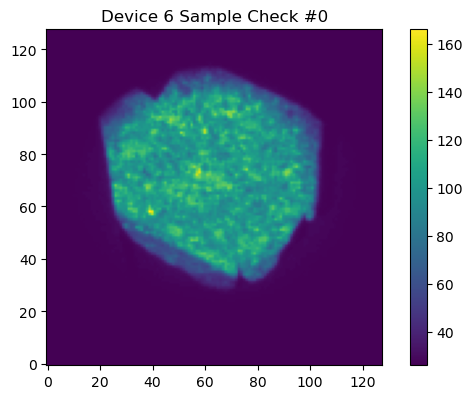

-----------------------------------


In [59]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='Sample Check', 
    roi=True, 
    show_img=True)

In [60]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_5_l', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.016405999660491943
Exposure Auto set to 0
Exposure current Value: 0.016404999420046806
Image 0 written to ..\data\sample_5_l\0_650\650_0_img.tif
Exposure current Value: 0.016404999420046806
Image 1 written to ..\data\sample_5_l\0_650\650_1_img.tif
Exposure current Value: 0.016404999420046806
Image 2 written to ..\data\sample_5_l\0_650\650_2_img.tif
Exposure current Value: 0.016404999420046806
Image 3 written to ..\data\sample_5_l\0_650\650_3_img.tif
Exposure current Value: 0.016404999420046806
Image 4 written to ..\data\sample_5_l\0_650\650_4_img.tif
Exposure current Value: 0.016404999420046806
Image 5 written to ..\data\sample_5_l\0_650\650_5_img.tif
Exposure current Value: 0.016404999420046806
Image 6 written to ..\data\sample_5_l\0_650\650_6_img.tif
Exposure current Value: 0.016404999420046806
Image 7 written to ..\data\sample_5_l\0_650\650_7_img.tif
Exposure current Value: 0.016

In [61]:
osc.record_exposures(cameras, sample_exposures, 'sample_5_l')

# Dark Frame Imaging

Now we use the recorded exposures to capture dark frames.

Check:
1. Lens cap is in place

In [ ]:
osc.prepare_dark_acquisition(ic)

## Reflectance Calibration Dark Frames.

Load calibration target exposures

In [3]:
calibration_exposures = osc.load_exposures(cameras, 'reflectance_calibration')

In [4]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='reflectance_calibration_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006812999956309795
Exposure Auto set to 0
Exposure current Value: 0.006812000181525946
Image 0 written to ..\data\reflectance_calibration_d\0_650\650_0_drk.tif
Exposure current Value: 0.006812000181525946
Image 1 written to ..\data\reflectance_calibration_d\0_650\650_1_drk.tif
Exposure current Value: 0.006812000181525946
Image 2 written to ..\data\reflectance_calibration_d\0_650\650_2_drk.tif
Exposure current Value: 0.006812000181525946
Image 3 written to ..\data\reflectance_calibration_d\0_650\650_3_drk.tif
Exposure current Value: 0.006812000181525946
Image 4 written to ..\data\reflectance_calibration_d\0_650\650_4_drk.tif
Exposure current Value: 0.006812000181525946
Image 5 written to ..\data\reflectance_calibration_d\0_650\650_5_drk.tif
Exposure current Value: 0.006812000181525946
Image 6 written to ..\data\reflectance_calibration_d\0_650\650_6_drk.tif
Exposure current Value: 0.0

## Geometric Calibration Dark Frames.

In [5]:
geometric_exposures = osc.load_exposures(cameras, 'geometric_calibration')

In [6]:
osc.capture_channel_images(
    cameras, 
    geometric_exposures, 
    subject='geometric_calibration_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.00940799992531538
Exposure Auto set to 0
Exposure current Value: 0.009406999684870243
Image 0 written to ..\data\geometric_calibration_d\0_650\650_0_drk.tif
Exposure current Value: 0.009406999684870243
Image 1 written to ..\data\geometric_calibration_d\0_650\650_1_drk.tif
Exposure current Value: 0.009406999684870243
Image 2 written to ..\data\geometric_calibration_d\0_650\650_2_drk.tif
Exposure current Value: 0.009406999684870243
Image 3 written to ..\data\geometric_calibration_d\0_650\650_3_drk.tif
Exposure current Value: 0.009406999684870243
Image 4 written to ..\data\geometric_calibration_d\0_650\650_4_drk.tif
Exposure current Value: 0.009406999684870243
Image 5 written to ..\data\geometric_calibration_d\0_650\650_5_drk.tif
Exposure current Value: 0.009406999684870243
Image 6 written to ..\data\geometric_calibration_d\0_650\650_6_drk.tif
Exposure current Value: 0.0094069996848702

## Dark Calibration Dark Frames

In [7]:
dark_calibration_exposures = osc.load_exposures(cameras, 'dark_reflectance_calibration')

In [8]:
osc.capture_channel_images(
    cameras, 
    dark_calibration_exposures, 
    subject='dark_reflectance_calibration_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.12170299887657166
Exposure Auto set to 0
Exposure current Value: 0.12170200049877167
Image 0 written to ..\data\dark_reflectance_calibration_d\0_650\650_0_drk.tif
Exposure current Value: 0.12170200049877167
Image 1 written to ..\data\dark_reflectance_calibration_d\0_650\650_1_drk.tif
Exposure current Value: 0.12170200049877167
Image 2 written to ..\data\dark_reflectance_calibration_d\0_650\650_2_drk.tif
Exposure current Value: 0.12170200049877167
Image 3 written to ..\data\dark_reflectance_calibration_d\0_650\650_3_drk.tif
Exposure current Value: 0.12170200049877167
Image 4 written to ..\data\dark_reflectance_calibration_d\0_650\650_4_drk.tif
Exposure current Value: 0.12170200049877167
Image 5 written to ..\data\dark_reflectance_calibration_d\0_650\650_5_drk.tif
Exposure current Value: 0.12170200049877167
Image 6 written to ..\data\dark_reflectance_calibration_d\0_650\650_6_drk.tif


## Capture Sample Dark Frames.

## Left 

### Sample 1

In [9]:
sample_exposures = osc.load_exposures(cameras, 'sample_1_l')

In [10]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_1_l_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.016147000715136528
Exposure Auto set to 0
Exposure current Value: 0.016147000715136528
Image 0 written to ..\data\sample_1_l_d\0_650\650_0_drk.tif
Exposure current Value: 0.016147000715136528
Image 1 written to ..\data\sample_1_l_d\0_650\650_1_drk.tif
Exposure current Value: 0.016147000715136528
Image 2 written to ..\data\sample_1_l_d\0_650\650_2_drk.tif
Exposure current Value: 0.016147000715136528
Image 3 written to ..\data\sample_1_l_d\0_650\650_3_drk.tif
Exposure current Value: 0.016147000715136528
Image 4 written to ..\data\sample_1_l_d\0_650\650_4_drk.tif
Exposure current Value: 0.016147000715136528
Image 5 written to ..\data\sample_1_l_d\0_650\650_5_drk.tif
Exposure current Value: 0.016147000715136528
Image 6 written to ..\data\sample_1_l_d\0_650\650_6_drk.tif
Exposure current Value: 0.016147000715136528
Image 7 written to ..\data\sample_1_l_d\0_650\650_7_drk.tif
Exposure curr

### Sample 2

In [11]:
sample_exposures = osc.load_exposures(cameras, 'sample_2_l')

In [12]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_2_l_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.03829500079154968
Exposure Auto set to 0
Exposure current Value: 0.03829500079154968
Image 0 written to ..\data\sample_2_l_d\0_650\650_0_drk.tif
Exposure current Value: 0.03829500079154968
Image 1 written to ..\data\sample_2_l_d\0_650\650_1_drk.tif
Exposure current Value: 0.03829500079154968
Image 2 written to ..\data\sample_2_l_d\0_650\650_2_drk.tif
Exposure current Value: 0.03829500079154968
Image 3 written to ..\data\sample_2_l_d\0_650\650_3_drk.tif
Exposure current Value: 0.03829500079154968
Image 4 written to ..\data\sample_2_l_d\0_650\650_4_drk.tif
Exposure current Value: 0.03829500079154968
Image 5 written to ..\data\sample_2_l_d\0_650\650_5_drk.tif
Exposure current Value: 0.03829500079154968
Image 6 written to ..\data\sample_2_l_d\0_650\650_6_drk.tif
Exposure current Value: 0.03829500079154968
Image 7 written to ..\data\sample_2_l_d\0_650\650_7_drk.tif
Exposure current Value

### Sample 3

In [13]:
sample_exposures = osc.load_exposures(cameras, 'sample_3_l')

In [14]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_3_l_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.09002500027418137
Exposure Auto set to 0
Exposure current Value: 0.09002500027418137
Image 0 written to ..\data\sample_3_l_d\0_650\650_0_drk.tif
Exposure current Value: 0.09002500027418137
Image 1 written to ..\data\sample_3_l_d\0_650\650_1_drk.tif
Exposure current Value: 0.09002500027418137
Image 2 written to ..\data\sample_3_l_d\0_650\650_2_drk.tif
Exposure current Value: 0.09002500027418137
Image 3 written to ..\data\sample_3_l_d\0_650\650_3_drk.tif
Exposure current Value: 0.09002500027418137
Image 4 written to ..\data\sample_3_l_d\0_650\650_4_drk.tif
Exposure current Value: 0.09002500027418137
Image 5 written to ..\data\sample_3_l_d\0_650\650_5_drk.tif
Exposure current Value: 0.09002500027418137
Image 6 written to ..\data\sample_3_l_d\0_650\650_6_drk.tif
Exposure current Value: 0.09002500027418137
Image 7 written to ..\data\sample_3_l_d\0_650\650_7_drk.tif
Exposure current Value

### Sample 4

In [15]:
sample_exposures = osc.load_exposures(cameras, 'sample_4_l')

In [16]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_4_l_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.08859600126743317
Exposure Auto set to 0
Exposure current Value: 0.08859600126743317
Image 0 written to ..\data\sample_4_l_d\0_650\650_0_drk.tif
Exposure current Value: 0.08859600126743317
Image 1 written to ..\data\sample_4_l_d\0_650\650_1_drk.tif
Exposure current Value: 0.08859600126743317
Image 2 written to ..\data\sample_4_l_d\0_650\650_2_drk.tif
Exposure current Value: 0.08859600126743317
Image 3 written to ..\data\sample_4_l_d\0_650\650_3_drk.tif
Exposure current Value: 0.08859600126743317
Image 4 written to ..\data\sample_4_l_d\0_650\650_4_drk.tif
Exposure current Value: 0.08859600126743317
Image 5 written to ..\data\sample_4_l_d\0_650\650_5_drk.tif
Exposure current Value: 0.08859600126743317
Image 6 written to ..\data\sample_4_l_d\0_650\650_6_drk.tif
Exposure current Value: 0.08859600126743317
Image 7 written to ..\data\sample_4_l_d\0_650\650_7_drk.tif
Exposure current Value

### Sample 5

In [17]:
sample_exposures = osc.load_exposures(cameras, 'sample_5_l')

In [18]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_5_l_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.016405999660491943
Exposure Auto set to 0
Exposure current Value: 0.016404999420046806
Image 0 written to ..\data\sample_5_l_d\0_650\650_0_drk.tif
Exposure current Value: 0.016404999420046806
Image 1 written to ..\data\sample_5_l_d\0_650\650_1_drk.tif
Exposure current Value: 0.016404999420046806
Image 2 written to ..\data\sample_5_l_d\0_650\650_2_drk.tif
Exposure current Value: 0.016404999420046806
Image 3 written to ..\data\sample_5_l_d\0_650\650_3_drk.tif
Exposure current Value: 0.016404999420046806
Image 4 written to ..\data\sample_5_l_d\0_650\650_4_drk.tif
Exposure current Value: 0.016404999420046806
Image 5 written to ..\data\sample_5_l_d\0_650\650_5_drk.tif
Exposure current Value: 0.016404999420046806
Image 6 written to ..\data\sample_5_l_d\0_650\650_6_drk.tif
Exposure current Value: 0.016404999420046806
Image 7 written to ..\data\sample_5_l_d\0_650\650_7_drk.tif
Exposure curr

## Right 

### Sample 1

In [19]:
sample_exposures = osc.load_exposures(cameras, 'sample_1_r')

In [20]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_1_r_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.020204000174999237
Exposure Auto set to 0
Exposure current Value: 0.020204000174999237
Image 0 written to ..\data\sample_1_r_d\0_650\650_0_drk.tif
Exposure current Value: 0.020204000174999237
Image 1 written to ..\data\sample_1_r_d\0_650\650_1_drk.tif
Exposure current Value: 0.020204000174999237
Image 2 written to ..\data\sample_1_r_d\0_650\650_2_drk.tif
Exposure current Value: 0.020204000174999237
Image 3 written to ..\data\sample_1_r_d\0_650\650_3_drk.tif
Exposure current Value: 0.020204000174999237
Image 4 written to ..\data\sample_1_r_d\0_650\650_4_drk.tif
Exposure current Value: 0.020204000174999237
Image 5 written to ..\data\sample_1_r_d\0_650\650_5_drk.tif
Exposure current Value: 0.020204000174999237
Image 6 written to ..\data\sample_1_r_d\0_650\650_6_drk.tif
Exposure current Value: 0.020204000174999237
Image 7 written to ..\data\sample_1_r_d\0_650\650_7_drk.tif
Exposure curr

### Sample 2

In [21]:
sample_exposures = osc.load_exposures(cameras, 'sample_2_r')

In [22]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_2_r_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.05993000045418739
Exposure Auto set to 0
Exposure current Value: 0.05993000045418739
Image 0 written to ..\data\sample_2_r_d\0_650\650_0_drk.tif
Exposure current Value: 0.05993000045418739
Image 1 written to ..\data\sample_2_r_d\0_650\650_1_drk.tif
Exposure current Value: 0.05993000045418739
Image 2 written to ..\data\sample_2_r_d\0_650\650_2_drk.tif
Exposure current Value: 0.05993000045418739
Image 3 written to ..\data\sample_2_r_d\0_650\650_3_drk.tif
Exposure current Value: 0.05993000045418739
Image 4 written to ..\data\sample_2_r_d\0_650\650_4_drk.tif
Exposure current Value: 0.05993000045418739
Image 5 written to ..\data\sample_2_r_d\0_650\650_5_drk.tif
Exposure current Value: 0.05993000045418739
Image 6 written to ..\data\sample_2_r_d\0_650\650_6_drk.tif
Exposure current Value: 0.05993000045418739
Image 7 written to ..\data\sample_2_r_d\0_650\650_7_drk.tif
Exposure current Value

### Sample 3

In [23]:
sample_exposures = osc.load_exposures(cameras, 'sample_3_r')

In [24]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_3_r_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.11098700016736984
Exposure Auto set to 0
Exposure current Value: 0.11098700016736984
Image 0 written to ..\data\sample_3_r_d\0_650\650_0_drk.tif
Exposure current Value: 0.11098700016736984
Image 1 written to ..\data\sample_3_r_d\0_650\650_1_drk.tif
Exposure current Value: 0.11098700016736984
Image 2 written to ..\data\sample_3_r_d\0_650\650_2_drk.tif
Exposure current Value: 0.11098700016736984
Image 3 written to ..\data\sample_3_r_d\0_650\650_3_drk.tif
Exposure current Value: 0.11098700016736984
Image 4 written to ..\data\sample_3_r_d\0_650\650_4_drk.tif
Exposure current Value: 0.11098700016736984
Image 5 written to ..\data\sample_3_r_d\0_650\650_5_drk.tif
Exposure current Value: 0.11098700016736984
Image 6 written to ..\data\sample_3_r_d\0_650\650_6_drk.tif
Exposure current Value: 0.11098700016736984
Image 7 written to ..\data\sample_3_r_d\0_650\650_7_drk.tif
Exposure current Value

### Sample 4

In [25]:
sample_exposures = osc.load_exposures(cameras, 'sample_4_r')

In [26]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_4_r_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.08859600126743317
Exposure Auto set to 0
Exposure current Value: 0.08859600126743317
Image 0 written to ..\data\sample_4_r_d\0_650\650_0_drk.tif
Exposure current Value: 0.08859600126743317
Image 1 written to ..\data\sample_4_r_d\0_650\650_1_drk.tif
Exposure current Value: 0.08859600126743317
Image 2 written to ..\data\sample_4_r_d\0_650\650_2_drk.tif
Exposure current Value: 0.08859600126743317
Image 3 written to ..\data\sample_4_r_d\0_650\650_3_drk.tif
Exposure current Value: 0.08859600126743317
Image 4 written to ..\data\sample_4_r_d\0_650\650_4_drk.tif
Exposure current Value: 0.08859600126743317
Image 5 written to ..\data\sample_4_r_d\0_650\650_5_drk.tif
Exposure current Value: 0.08859600126743317
Image 6 written to ..\data\sample_4_r_d\0_650\650_6_drk.tif
Exposure current Value: 0.08859600126743317
Image 7 written to ..\data\sample_4_r_d\0_650\650_7_drk.tif
Exposure current Value

### Sample 5

In [27]:
sample_exposures = osc.load_exposures(cameras, 'sample_5_r')

In [28]:
osc.capture_channel_images(
    cameras, 
    sample_exposures, 
    subject='sample_5_r_d', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.020493000745773315
Exposure Auto set to 0
Exposure current Value: 0.020493000745773315
Image 0 written to ..\data\sample_5_r_d\0_650\650_0_drk.tif
Exposure current Value: 0.020493000745773315
Image 1 written to ..\data\sample_5_r_d\0_650\650_1_drk.tif
Exposure current Value: 0.020493000745773315
Image 2 written to ..\data\sample_5_r_d\0_650\650_2_drk.tif
Exposure current Value: 0.020493000745773315
Image 3 written to ..\data\sample_5_r_d\0_650\650_3_drk.tif
Exposure current Value: 0.020493000745773315
Image 4 written to ..\data\sample_5_r_d\0_650\650_4_drk.tif
Exposure current Value: 0.020493000745773315
Image 5 written to ..\data\sample_5_r_d\0_650\650_5_drk.tif
Exposure current Value: 0.020493000745773315
Image 6 written to ..\data\sample_5_r_d\0_650\650_6_drk.tif
Exposure current Value: 0.020493000745773315
Image 7 written to ..\data\sample_5_r_d\0_650\650_7_drk.tif
Exposure curr

# Repeat Dark Calibration Target Imaging

Repeating for validating the spectral reflectance retrieval, and if neccessary for further reflectance calibration, afgter the complete sequence has been captured.

Find the optimal exposures for dark calibration target imaging.

In [29]:
dark_calibration_exposures = osc.find_channel_exposures(cameras, init_t_exp=1.0, limit=10)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 151.0, Target: 150
Success after 1 trials
Exposure current Value: 0.11764699965715408
-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 112.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.15756294131278992
Exposure set to 0.1575620025396347 (err of 9.434297680854797e-07
Trial 2:
Quantile: 142.0

Check the calibration target images.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.11764699965715408
Exposure Auto set to 0


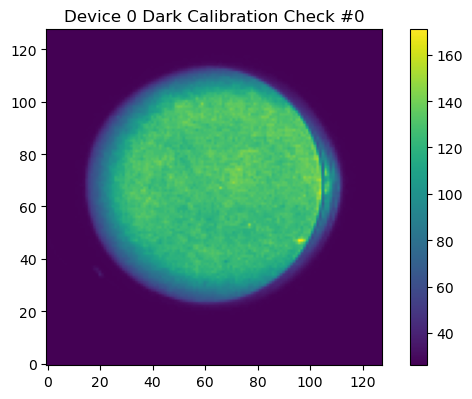

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.1698630005121231
Exposure Auto set to 0


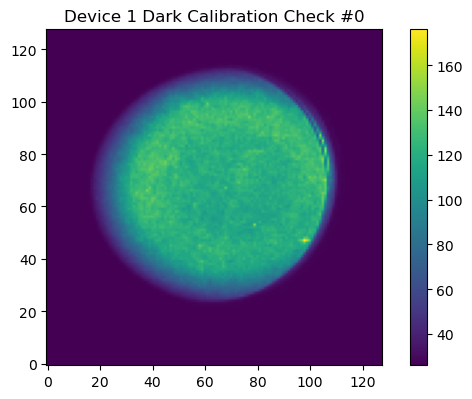

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.8162220120429993
Exposure Auto set to 0


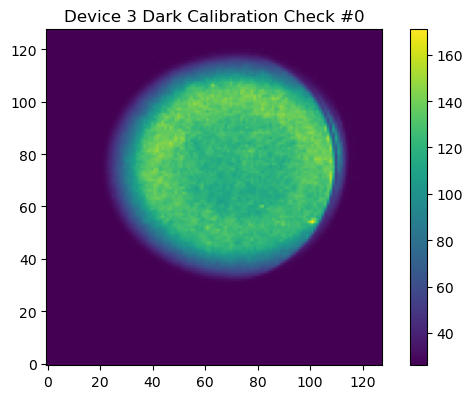

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.07985199987888336
Exposure Auto set to 0


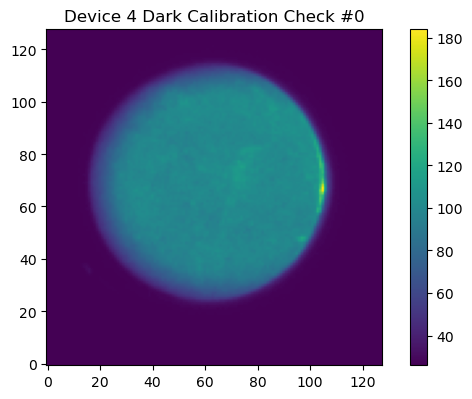

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.26718398928642273
Exposure Auto set to 0


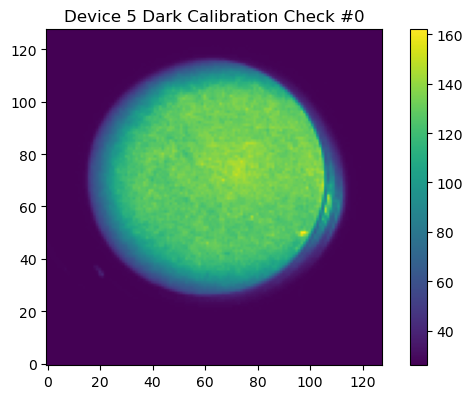

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.9025989770889282
Exposure Auto set to 0


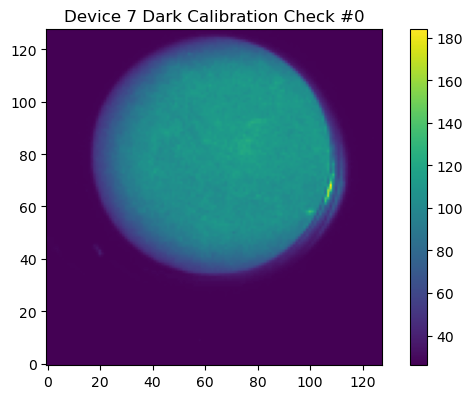

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.04036400094628334
Exposure Auto set to 0


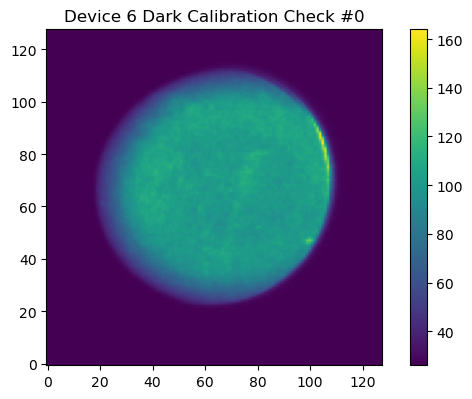

-----------------------------------


In [30]:
osc.capture_channel_images(
    cameras, 
    dark_calibration_exposures, 
    subject='Dark Calibration Check', 
    roi=True, 
    show_img=True)

Capture 10 repeat images of the calibration target in each channel.

In [31]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='dark_reflectance_calibration_2', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006812999956309795
Exposure Auto set to 0
Exposure current Value: 0.006812000181525946
Image 0 written to ..\data\dark_reflectance_calibration_2\0_650\650_0_img.tif
Exposure current Value: 0.006812000181525946
Image 1 written to ..\data\dark_reflectance_calibration_2\0_650\650_1_img.tif
Exposure current Value: 0.006812000181525946
Image 2 written to ..\data\dark_reflectance_calibration_2\0_650\650_2_img.tif
Exposure current Value: 0.006812000181525946
Image 3 written to ..\data\dark_reflectance_calibration_2\0_650\650_3_img.tif
Exposure current Value: 0.006812000181525946
Image 4 written to ..\data\dark_reflectance_calibration_2\0_650\650_4_img.tif
Exposure current Value: 0.006812000181525946
Image 5 written to ..\data\dark_reflectance_calibration_2\0_650\650_5_img.tif
Exposure current Value: 0.006812000181525946
Image 6 written to ..\data\dark_reflectance_calibration_2\0_650\650_6_

Write the exposures to file.

In [32]:
osc.record_exposures(cameras, dark_calibration_exposures, 'dark_reflectance_calibration_2')

In [41]:
calibration_exposures = osc.load_exposures(cameras, 'dark_reflectance_calibration_2')

In [42]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='dark_reflectance_calibration_2', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.11764699965715408
Exposure Auto set to 0
Exposure current Value: 0.1176460012793541
Image 0 written to ..\data\dark_reflectance_calibration_2\0_650\650_0_drk.tif
Exposure current Value: 0.1176460012793541
Image 1 written to ..\data\dark_reflectance_calibration_2\0_650\650_1_drk.tif
Exposure current Value: 0.1176460012793541
Image 2 written to ..\data\dark_reflectance_calibration_2\0_650\650_2_drk.tif
Exposure current Value: 0.1176460012793541
Image 3 written to ..\data\dark_reflectance_calibration_2\0_650\650_3_drk.tif
Exposure current Value: 0.1176460012793541
Image 4 written to ..\data\dark_reflectance_calibration_2\0_650\650_4_drk.tif
Exposure current Value: 0.1176460012793541
Image 5 written to ..\data\dark_reflectance_calibration_2\0_650\650_5_drk.tif
Exposure current Value: 0.1176460012793541
Image 6 written to ..\data\dark_reflectance_calibration_2\0_650\650_6_drk.tif
Exposur

# Repeat Reflectance Calibration

Also repeat the capture of reflectance calibration images at the end of the sequence.
Noe it may have been too long with inactivity on both the cameras and the lamp for this to be effective. To emulate, let's capture dummy repeat dark frames.

Find the optimal exposures for calibration target imaging.

In [34]:
calibration_exposures = osc.find_channel_exposures(cameras)

-----------------------------------
Device 0
-----------------------------------
Initiating search:
Exposure Auto set to 0
Exposure Value set to 1.0
Trial 0:
Quantile: 255.0, Target: 150
Exposure current Value: 1.0
Exposure Value set to 0.11764705926179886
Exposure set to 0.11764699965715408 (err of 5.916637532688007e-08
Trial 1:
Quantile: 255.0, Target: 150
Exposure current Value: 0.11764699965715408
Exposure Value set to 0.01384082343429327
Exposure set to 0.01384000014513731 (err of 8.233439396411468e-07
Trial 2:
Quantile: 255.0, Target: 150
Exposure current Value: 0.01384000014513731
Exposure Value set to 0.001628235331736505
Exposure set to 0.0016280000563710928 (err of 2.3525482153183633e-07
Trial 3:
Quantile: 56.0, Target: 150
Exposure current Value: 0.0016280000563710928
Exposure Value set to 0.004360714461654425
Exposure set to 0.004360000137239695 (err of 7.142994685894327e-07
Trial 4:
Quantile: 107.0, Target: 150
Exposure current Value: 0.004360000137239695
Exposure Value se

Check the calibration target images.

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006634000223129988
Exposure Auto set to 0


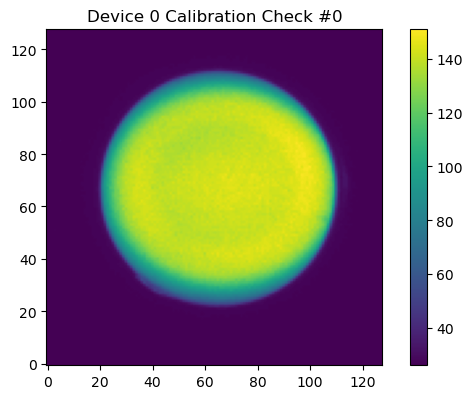

-----------------------------------
-----------------------------------
Device 1
-----------------------------------
Exposure Value set to 0.009173000231385231
Exposure Auto set to 0


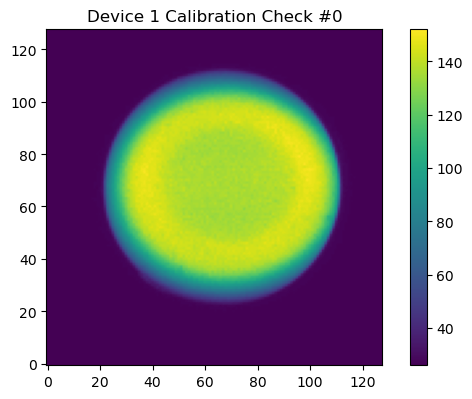

-----------------------------------
-----------------------------------
Device 3
-----------------------------------
Exposure Value set to 0.0405689999461174
Exposure Auto set to 0


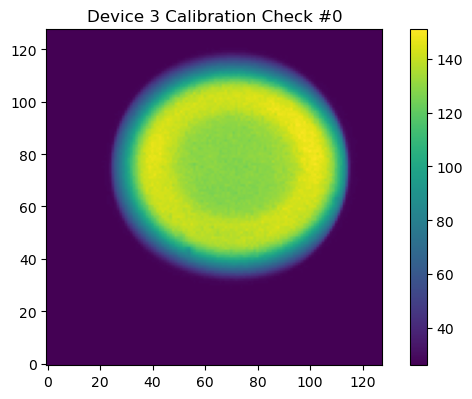

-----------------------------------
-----------------------------------
Device 4
-----------------------------------
Exposure Value set to 0.006391000002622604
Exposure Auto set to 0


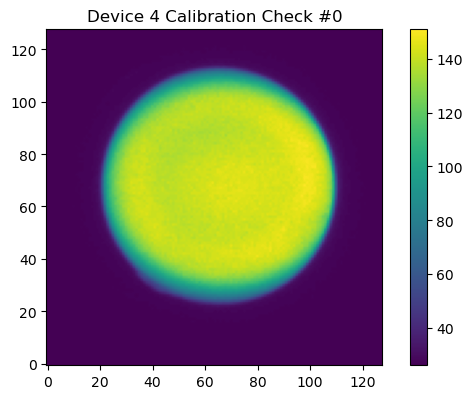

-----------------------------------
-----------------------------------
Device 5
-----------------------------------
Exposure Value set to 0.016047000885009766
Exposure Auto set to 0


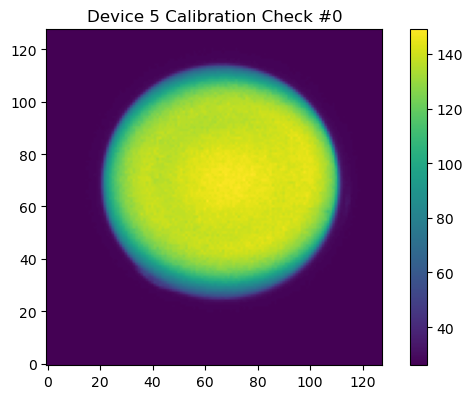

-----------------------------------
-----------------------------------
Device 7
-----------------------------------
Exposure Value set to 0.07454899698495865
Exposure Auto set to 0


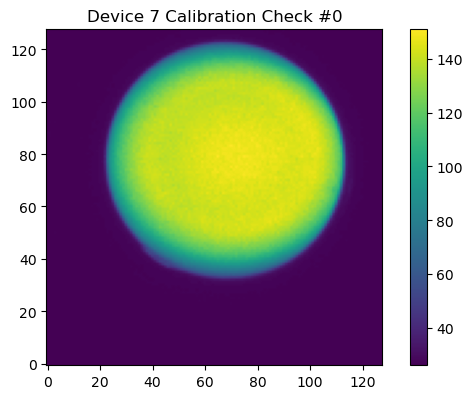

-----------------------------------
-----------------------------------
Device 6
-----------------------------------
Exposure Value set to 0.002862999914214015
Exposure Auto set to 0


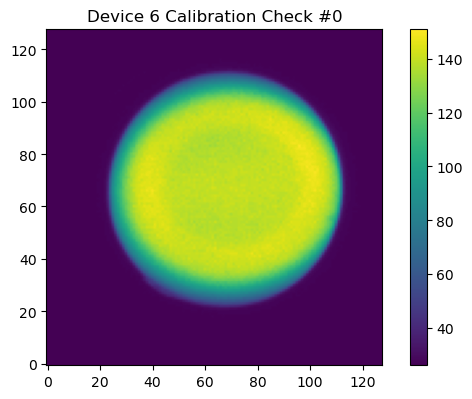

-----------------------------------


In [35]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='Calibration Check', 
    roi=True, 
    show_img=True)

Capture 10 repeat images of the calibration target in each channel.

In [37]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='reflectance_calibration_2', 
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006634000223129988
Exposure Auto set to 0
Exposure current Value: 0.006634000223129988
Image 0 written to ..\data\reflectance_calibration_2\0_650\650_0_img.tif
Exposure current Value: 0.006634000223129988
Image 1 written to ..\data\reflectance_calibration_2\0_650\650_1_img.tif
Exposure current Value: 0.006634000223129988
Image 2 written to ..\data\reflectance_calibration_2\0_650\650_2_img.tif
Exposure current Value: 0.006634000223129988
Image 3 written to ..\data\reflectance_calibration_2\0_650\650_3_img.tif
Exposure current Value: 0.006634000223129988
Image 4 written to ..\data\reflectance_calibration_2\0_650\650_4_img.tif
Exposure current Value: 0.006634000223129988
Image 5 written to ..\data\reflectance_calibration_2\0_650\650_5_img.tif
Exposure current Value: 0.006634000223129988
Image 6 written to ..\data\reflectance_calibration_2\0_650\650_6_img.tif
Exposure current Value: 0.0

Write the exposures to file.

In [38]:
osc.record_exposures(cameras, calibration_exposures, 'reflectance_calibration_2')

In [39]:
calibration_exposures = osc.load_exposures(cameras, 'reflectance_calibration_2')

In [40]:
osc.capture_channel_images(
    cameras, 
    calibration_exposures, 
    subject='reflectance_calibration_2', 
    img_type='drk',
    repeats=10,
    roi=False, 
    show_img=False,
    save_img=True)

-----------------------------------
Device 0
-----------------------------------
Exposure Value set to 0.006634000223129988
Exposure Auto set to 0
Exposure current Value: 0.006634000223129988
Image 0 written to ..\data\reflectance_calibration_2\0_650\650_0_drk.tif
Exposure current Value: 0.006634000223129988
Image 1 written to ..\data\reflectance_calibration_2\0_650\650_1_drk.tif
Exposure current Value: 0.006634000223129988
Image 2 written to ..\data\reflectance_calibration_2\0_650\650_2_drk.tif
Exposure current Value: 0.006634000223129988
Image 3 written to ..\data\reflectance_calibration_2\0_650\650_3_drk.tif
Exposure current Value: 0.006634000223129988
Image 4 written to ..\data\reflectance_calibration_2\0_650\650_4_drk.tif
Exposure current Value: 0.006634000223129988
Image 5 written to ..\data\reflectance_calibration_2\0_650\650_5_drk.tif
Exposure current Value: 0.006634000223129988
Image 6 written to ..\data\reflectance_calibration_2\0_650\650_6_drk.tif
Exposure current Value: 0.0